In [2]:
# %pip install torchvision

In [1]:
import eda_helpers as eda

/home/kpetrenko/work/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DATASET: https://huggingface.co/datasets/flwrlabs/fed-isic2019
Labels meaning = https://challenge.isic-archive.com/landing/2019/

```
@inproceedings{NEURIPS2022_232eee8e,
 author = {Ogier du Terrail, Jean and Ayed, Samy-Safwan and Cyffers, Edwige and Grimberg, Felix and He, Chaoyang and Loeb, Regis and Mangold, Paul and Marchand, Tanguy and Marfoq, Othmane and Mushtaq, Erum and Muzellec, Boris and Philippenko, Constantin and Silva, Santiago and Tele\'{n}czuk, Maria and Albarqouni, Shadi and Avestimehr, Salman and Bellet, Aur\'{e}lien and Dieuleveut, Aymeric and Jaggi, Martin and Karimireddy, Sai Praneeth and Lorenzi, Marco and Neglia, Giovanni and Tommasi, Marc and Andreux, Mathieu},
 booktitle = {Advances in Neural Information Processing Systems},
 editor = {S. Koyejo and S. Mohamed and A. Agarwal and D. Belgrave and K. Cho and A. Oh},
 pages = {5315--5334},
 publisher = {Curran Associates, Inc.},
 title = {FLamby: Datasets and Benchmarks for Cross-Silo Federated Learning in Realistic Healthcare Settings},
 url = {https://proceedings.neurips.cc/paper_files/paper/2022/file/232eee8ef411a0a316efa298d7be3c2b-Paper-Datasets_and_Benchmarks.pdf},
 volume = {35},
 year = {2022}
}

```

In [2]:
# Variables
DATASET_PATH = 'flwrlabs/fed-isic2019'
LABELS = list(map(str, range(8)))
GROUP_COL = 'center'

In [3]:
data = eda.download_dataset(DATASET_PATH, 'train')
data.head()

,image,center,label
0,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0,1
1,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0,2
2,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0,1
3,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0,3
4,<PIL.JpegImagePlugin.JpegImageFile image mode=...,0,1


In [6]:
data.isna().sum(axis=0)
# no misses

image     0
center    0
label     0
dtype: int64

/home/kpetrenko/work/third_attempt/EDA/eda_helpers.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot_df = sns_feed.applymap(format_annotation)


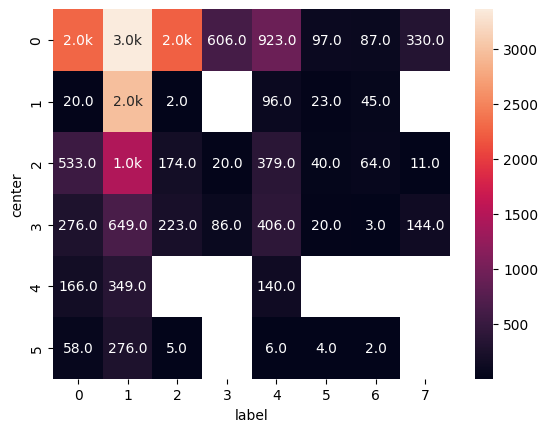

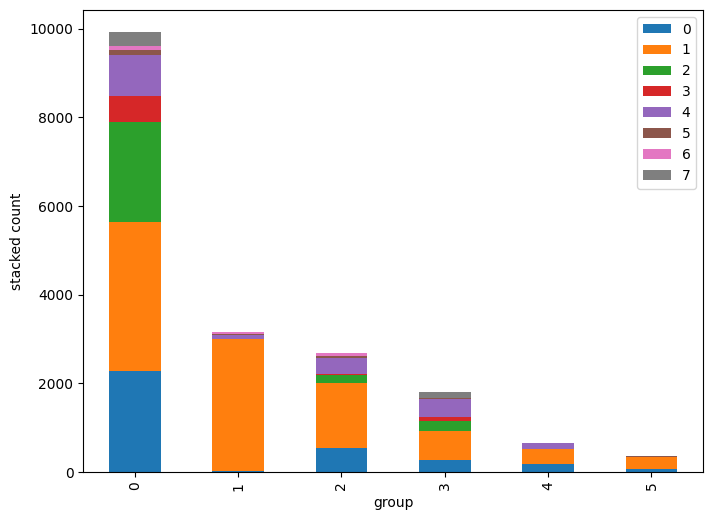

In [7]:
eda.twod_label_distribution(data, 'label', GROUP_COL, LABELS)

Из тепловой карты видно, что для некоторых пар (центр, label) нет изображений в датасете. Для задач FL это является удачным примером неравномерной распределенности данных между клиентами. В прикладных задачах FL у части клиентов может не быть данных определенного вида, которые есть на другой части клиентов. Для FL симуляций будет использовано в том числе парционирование по center_id, чтобы исследовать работу методов обучения при описанном раскладе - при отсутствии данных определенного вида на части клиентов. Для задач DDL будет рассмотрен случай, когда хосты обучаются на данных полученных из общего датасета, и в этом случае center_id можно как стирать (ситуация когда данные распределены как IID), так и оставлять и учитывать (ситуация приближенная к FL) 

К тому же, можно провести аугментацию для меньших классов, или возможно, усреднить самые близкие изображения большего класса, чтобы уровнять количество данных в каждом датацентре, и в отдельном сетапе -  по каждому label-у (болезнь). В первом случае, чтобы в каждом датацентре было одинаковое колоичество данных всего, во втором случае - чтобы у каждого label-а было одинаковое примерно количество экземляров. 

In [4]:
DOMAIN = data.center.unique()

In [9]:
data['image_size'] = data.image.apply(lambda x: x.size)
data.image_size.unique()
# есть разные размеры фото

array([(224, 224), (298, 224), (337, 224), (334, 224), (336, 224),
       (320, 224), (317, 224)], dtype=object)

In [10]:
# eda.resize_and_pad(data[data['image_size'] == (317, 224)]['image'].iloc[0], (224, 224))

In [5]:
data['image'] = data['image'].map(lambda x: eda.resize_and_pad(x, (224, 224)))

In [12]:
data.image.apply(lambda x: x.size).unique()

array([(224, 224)], dtype=object)

Все изображения приведены к одному размеру без потери отношения сторон, и дополнено бежевым цветом. Дальнейшие преобразования, которые будет выполнять модель, могут включать уменьшение изображения (чтобы подать на вход первому слою), но также с сохранением соотношения сторон. 

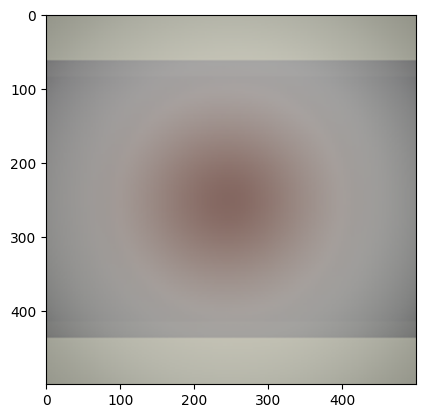

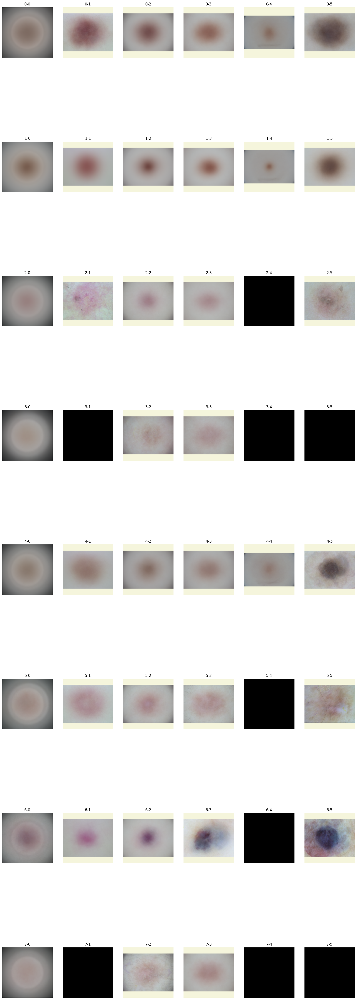

In [13]:
eda.draw_image_over_groups(data, lambda x: eda.Image.fromarray(eda.find_mean_photo(x)).resize((500, 500)), DOMAIN, LABELS, GROUP_COL, 'label', 'image')

Цвет на некоторых строчках явно выражен, что можно использовать для разделение классов моделью. Но поскольку цвет - является признаком класса болезни, не только форма и паттерны, то избавляться от цвета не планируется

Например, первые 2 строчки более коричневые, предпоследняя - фиолетивая.

Однако освещение может отличаться, от вечернего домашнего, до лабораторного, поэтому можно провести такую аугментацию, если она есть встроенная или легко достижимая. Если нет, то допускаем, что участниками являются только центры (аля клиники) у которых оборудование всегда дает одно и то же освещение

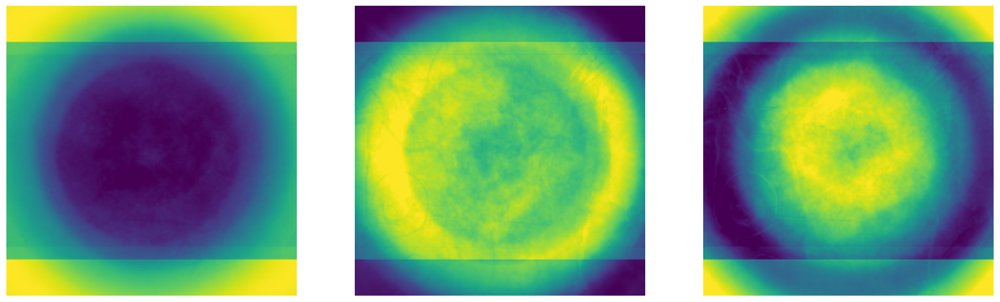

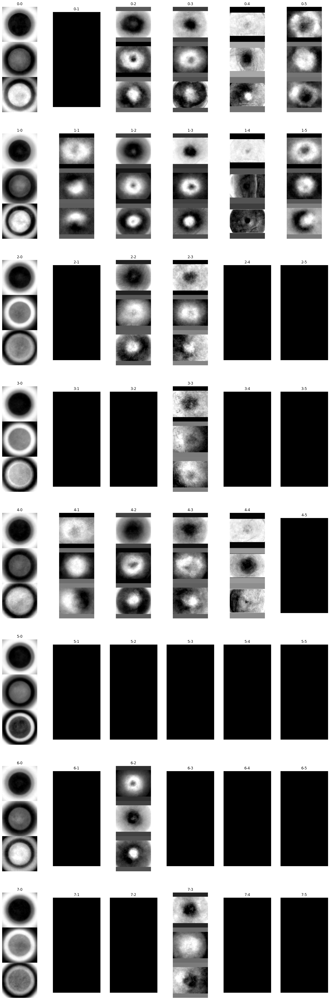

In [14]:
eda.draw_image_over_groups(data, lambda x: [eda.Image.fromarray(y).resize((500, 500)) for y in eda.find_eigenphoto(x)], DOMAIN, LABELS, GROUP_COL, 'label', 'image', random=True)

По eigen-изображениям, что являются сжатой информацией о пространстве датасета, можно понимать, относится ли изображение к определенному классу с какой-то ошибкой. При разложении по найденному базису, если расстояние до известных изображений в данном классе меньше некоторого трешхолда, то изображение принадлежит данному классу, иначе нет. Так ищутся лица по алгоритму eigenfaces. Но в этом случае стоит смотреть на первые векторы, поскольку они дают больше всего значимой информации о пространстве.

Описание построения изображения выше - брались 100 случайных фотографий из датасета, или определенной части датасета (один центр один label), отсекался случай, когда их меньше 50 и находились eigen-images, брались три самых значимых и выводились. Поэтому там, где изображение отсутствует, там было недостаточно изображений.

Первый центр имеет больше всего изображений, но как простанства для разных классов они не дают много информации по форме. Также в построении не учитывался цвет, поскольку обычно с eigenfaces работают в одном каналле. Но даже если рассматривать только яркость изображения, то некоторые классы довольно близки у первого центра.
Например, 5.0 и 3.0 как и 4.0 и 6.0 довольно похожи, и различить их по eigenvalues если и можно, то с очень большой ошибкой. 

Если же смотреть в разрезе по первому классу, то вектора не сильно похожи, особенно 0.4 и по третьему вектору. Видимо паттерн более сложный чем просто форма. Можно также посмотреть литературу, что является характеристикой каждой из болезни, кажется что просто формы недостаточно. 

Если посмотреть на 1 label, то картина следующая - 1.4 отличается, что может быть достаточно значительным, чтобы давать ошибки при разделении классов по eigen-pictures. 1.1 примерно также. В остальном обощение могло потерять паттерны, что есть на изображении, возможно из-за ротации.

In [15]:
# eda.see_samples(data, LABELS, DOMAIN, 2, 'image', GROUP_COL, 'label')

В целом выше видно, что
 - по 0 классу, родинки могут быть разных стадий развития, в том числе совсем незаметные, и в том числе какие-то запущенные, что не подходило под общий паттерн, который мог бы найтись на eigen-picutres.
 - по 1 классу - снова могут быть разные размеры
 - по 2 классу - есть паттерн вклаплений, что теряется на eigen-values
 - по 3 классу - вклапления или наслоения? Мало центров имеет его, не особо посмотреть
 - по 4 классу - разные стадии
 - по 5 классу - разные стадии, форма не всегда заметна
 - по 6 классу - ярко выражен цвет. Но если судить по цвету то можно спутать с каким-нибудь другим классом, что существует в test выборке (там специально добавили доп класс "другое") 
 - по 7 классу - мало изображений, слабо выражен паттерн

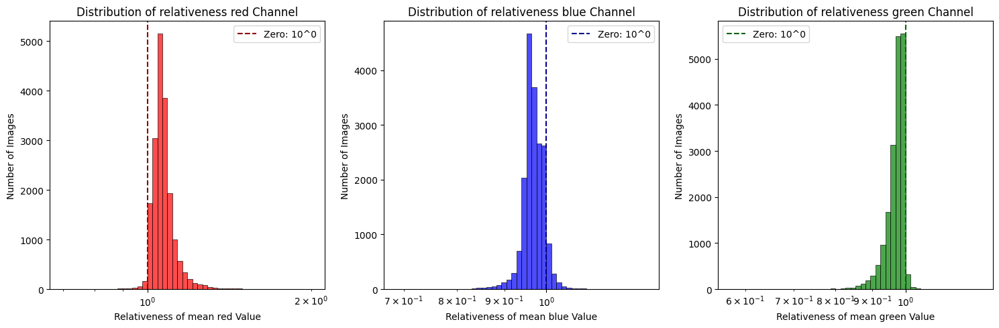

In [16]:
eda.draw_color_distrib(*eda.get_color_rels(eda.all_generator(data, 'image')))

У изображения бралось среднее по каждому каналу и записывалось отношение красного к голубому, голубого к зеленному и зеленного к красному. Если цветов примерно одинаково, то значение должно быть около 10^0, что также обозначалось цветом.

По общей картине, есть доминация красного цвета, что является понятынм явлением, поскольку смотрим на кожу. 

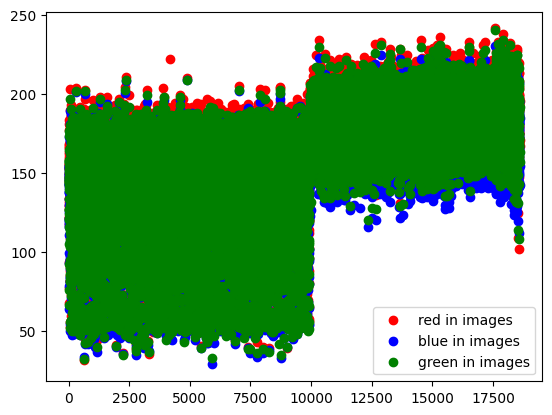

In [17]:
eda.draw_color_changes(*eda.get_colors(eda.all_generator(data, 'image')))

Очень странный подъем и сужение наверх около 10k изображений.
Давайте что-нибудь поймем - например, как классы или датацентры находятся относительного этого подъема

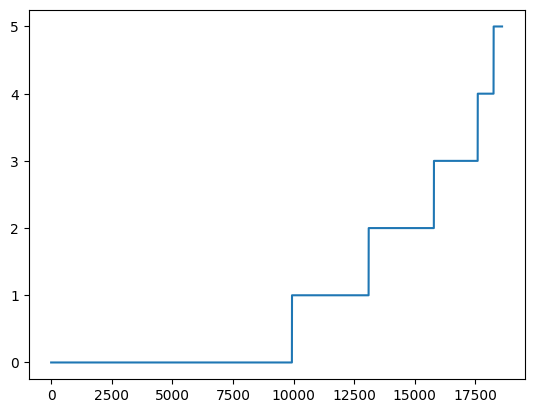

In [18]:
eda.plt.plot(list(eda.all_generator(data, 'center')))

Есть подозрение, что когда я ресайзила и дополняла бежевым, то это применилось ко всем изображением не первого центра, и случился перекос. Давайте это проверим

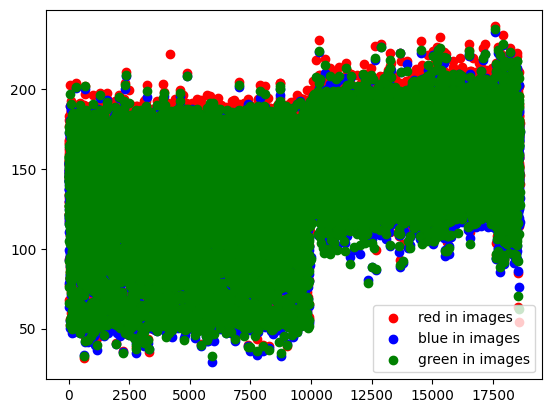

In [19]:
data_orig = eda.download_dataset(DATASET_PATH, 'train')
eda.draw_color_changes(*eda.get_colors(eda.all_generator(data_orig, 'image')))

Проблема все еще видна, так что дополнение бежевым только ухудшило распределение относительно датацентров, но не создало ее

Еще гипотеза, что это из-за черного цвета по краям изображений в первом датацентре, что дает такой перекос вниз. Как будто, можно смотреть на край изображения и перекрашивать соседние ячейки в что-то более нейтральное, аля в бежевый цвет, или в другие цвета (поскольку то, что находится на крае, не должно влять на классификацию). Если оставить как есть, а это половина датасета с другой цветовой палитрой, то модель может начать давать ответы в зависимости от того, какой цвет был найден на краях

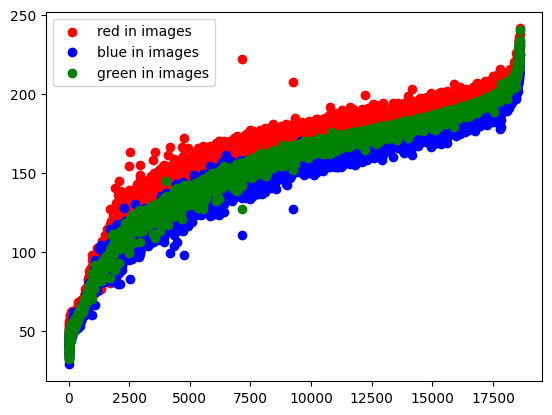

In [16]:
eda.draw_color_changes(*eda.get_colors(eda.sort_out_by_color(eda.all_generator(data, 'image'))))

Очень ярких и очень темных изображений не так уж много. Большинство имеют средний цвета в [100, 200]

0-0


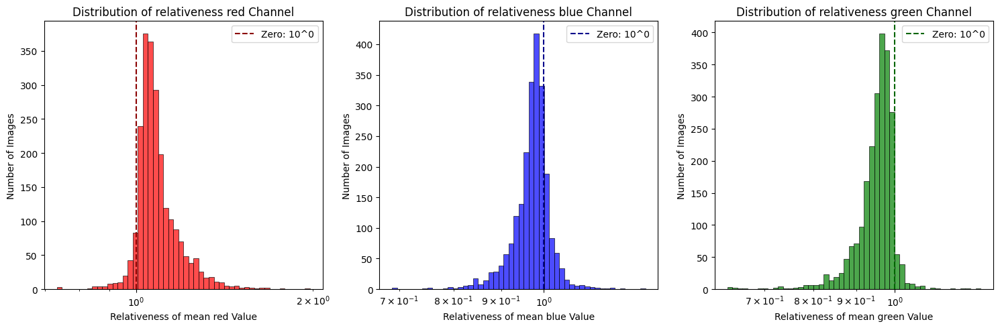

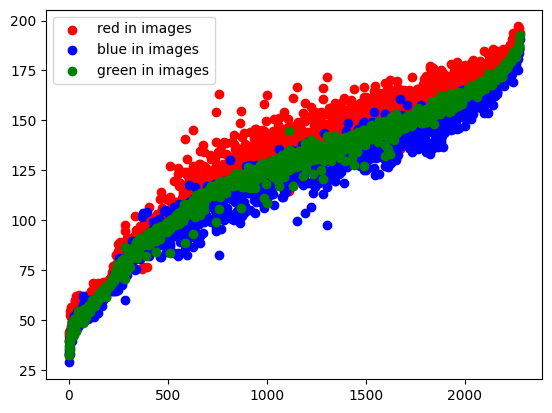

0-1


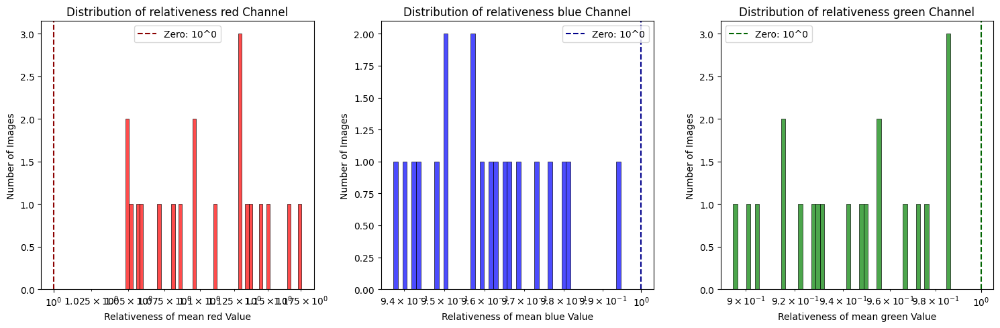

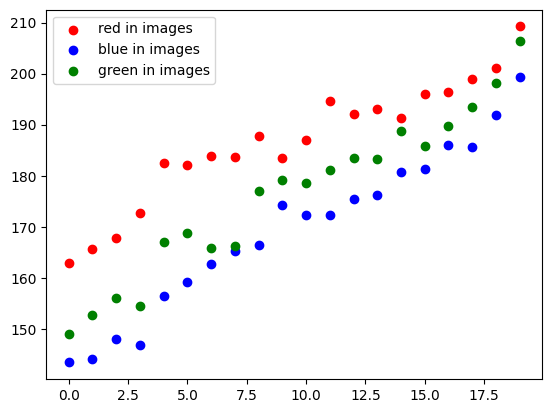

0-2


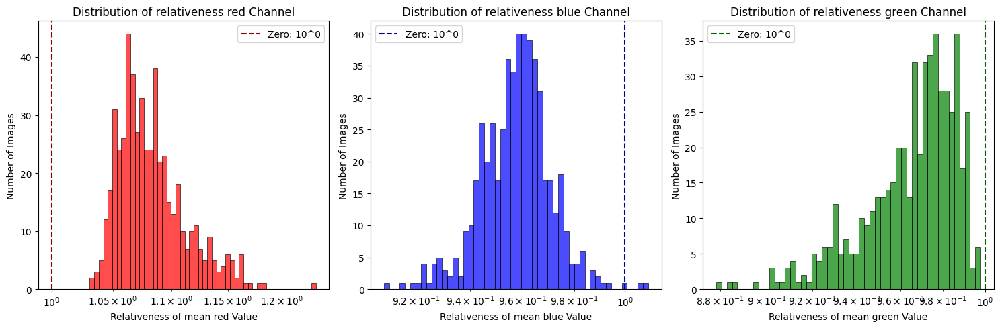

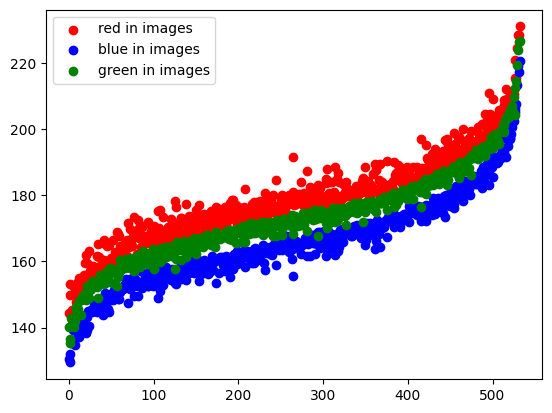

0-3


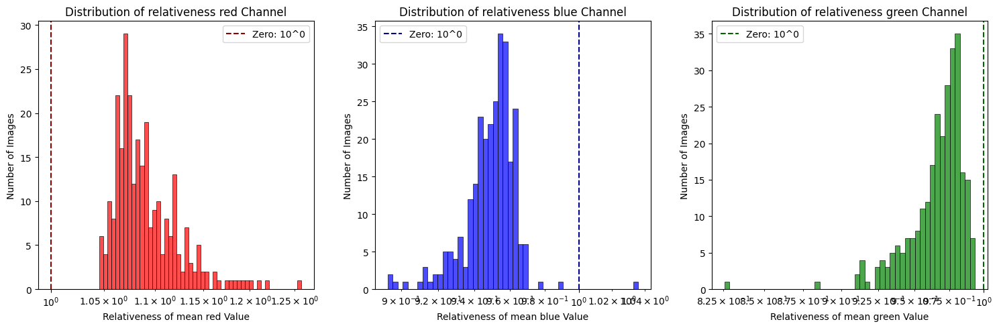

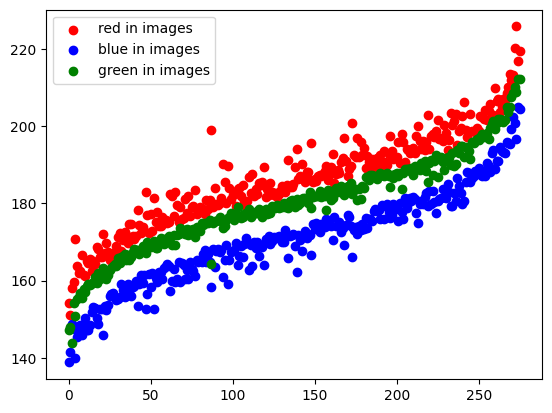

0-4


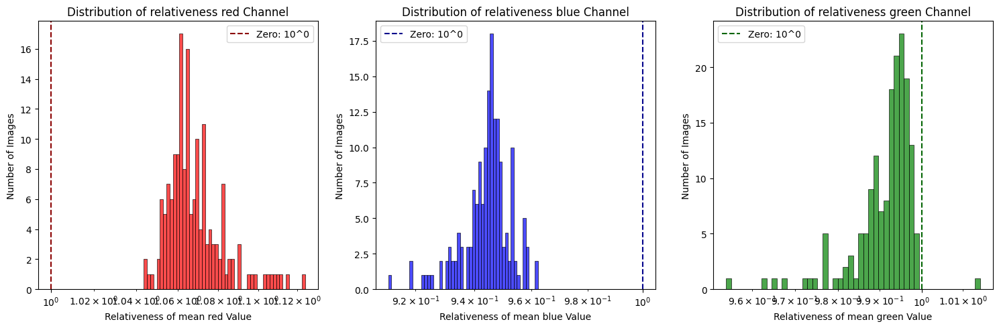

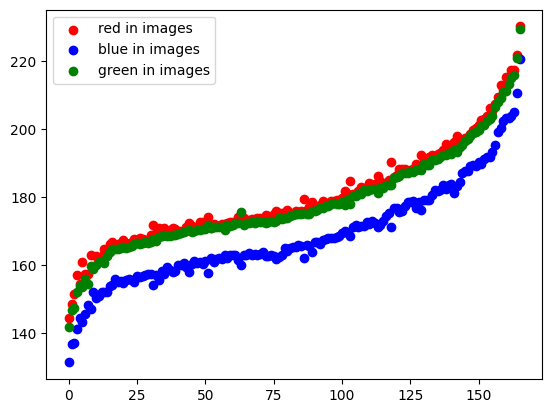

0-5


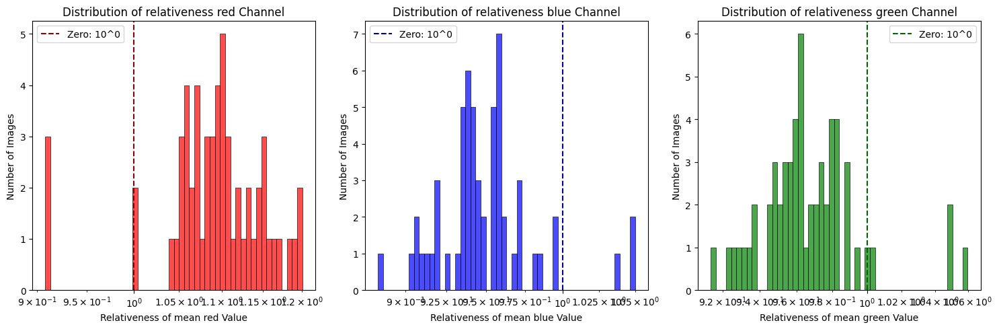

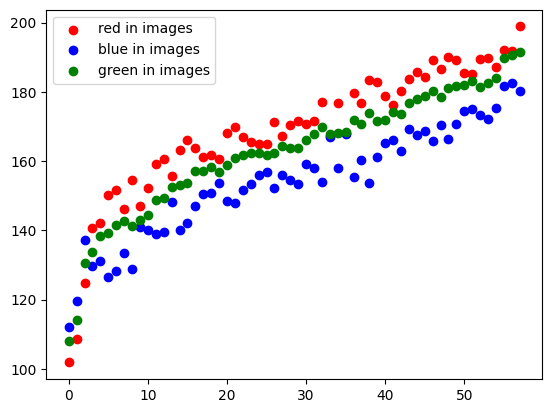

1-0


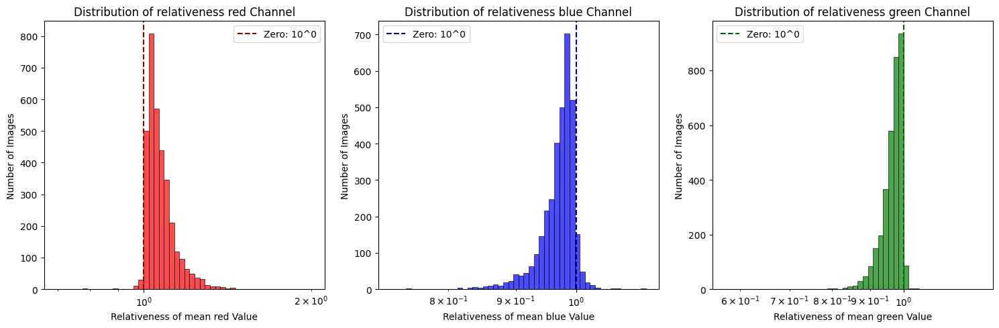

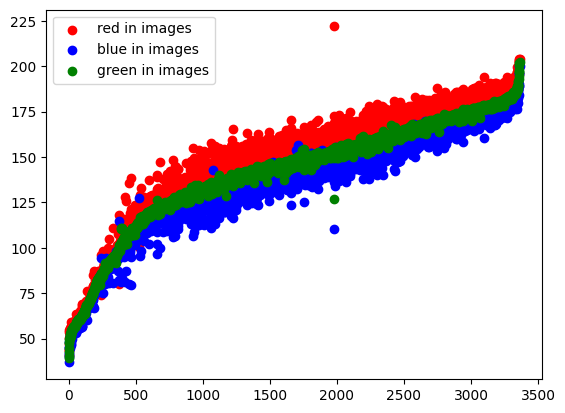

1-1


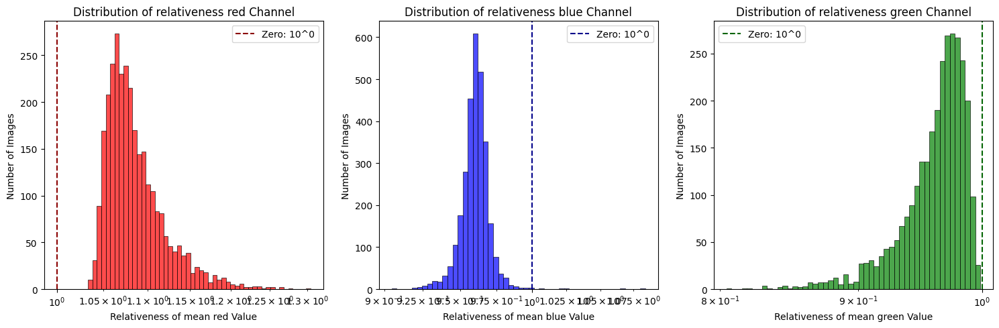

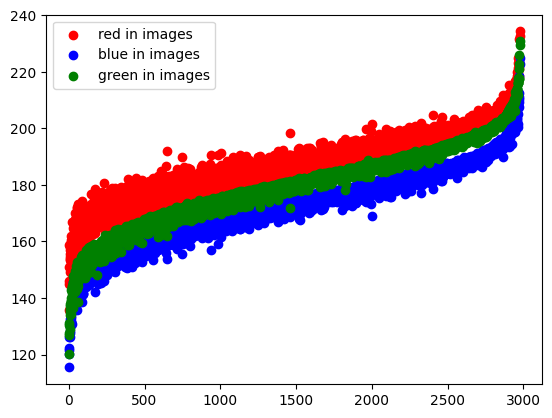

1-2


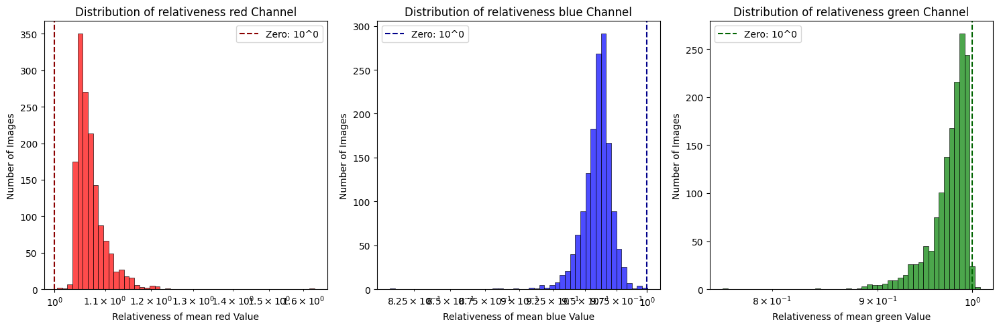

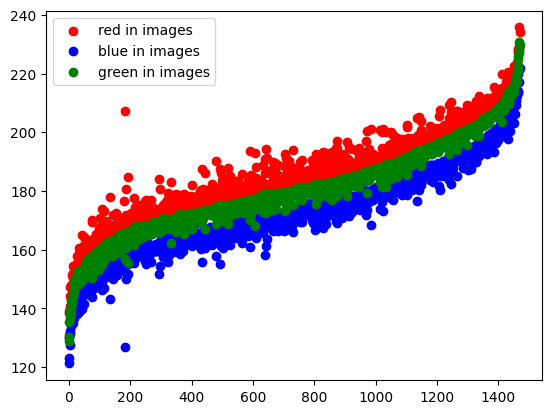

1-3


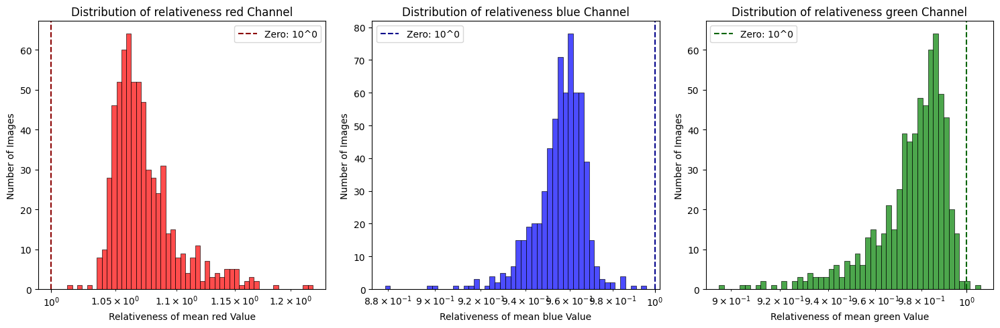

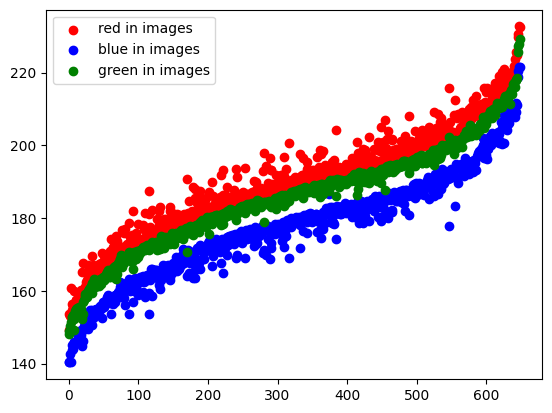

1-4


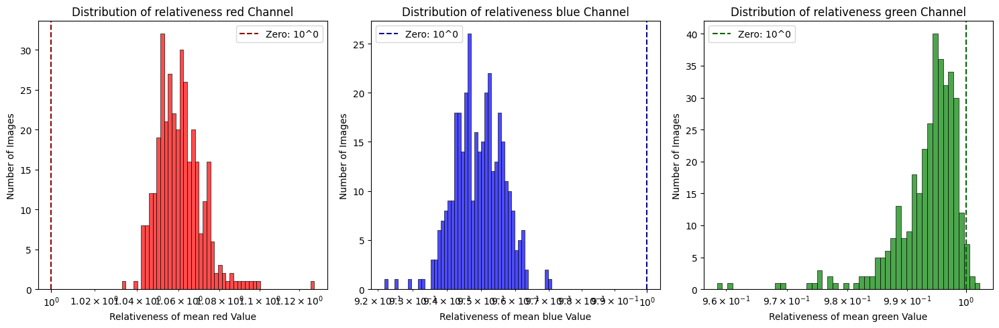

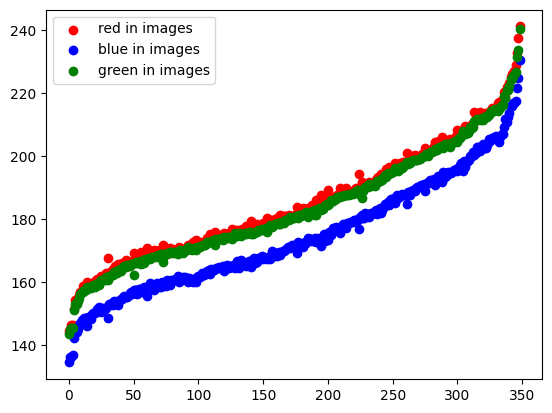

1-5


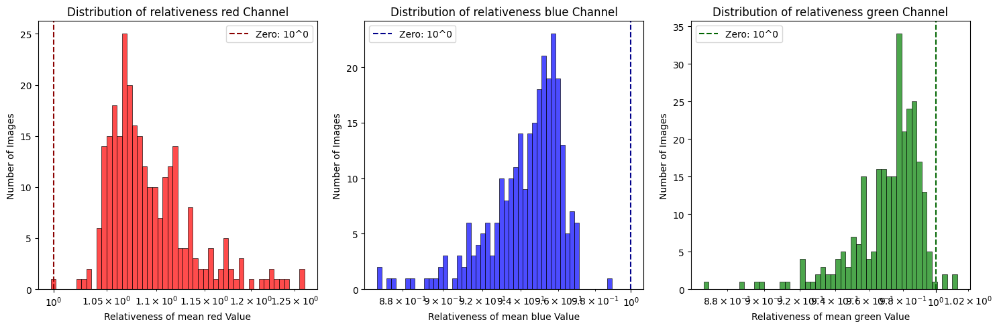

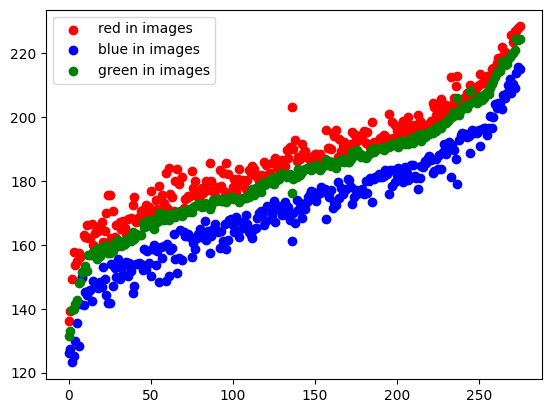

2-0


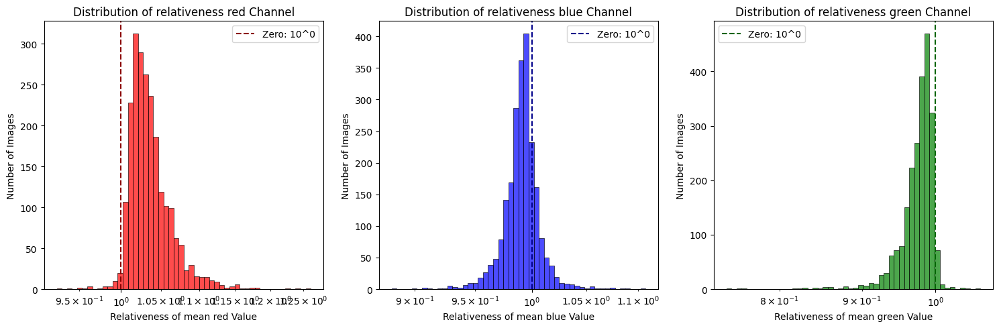

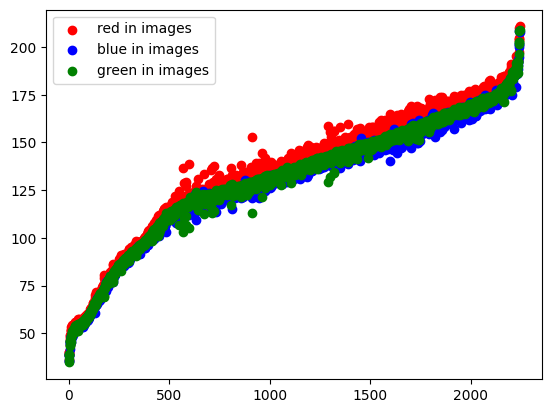

2-1


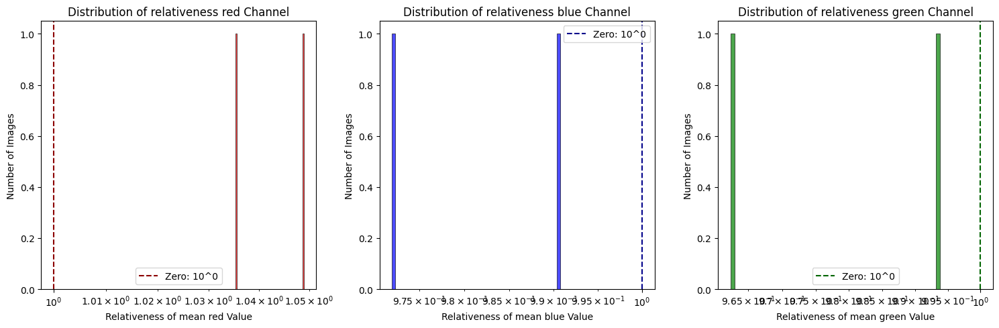

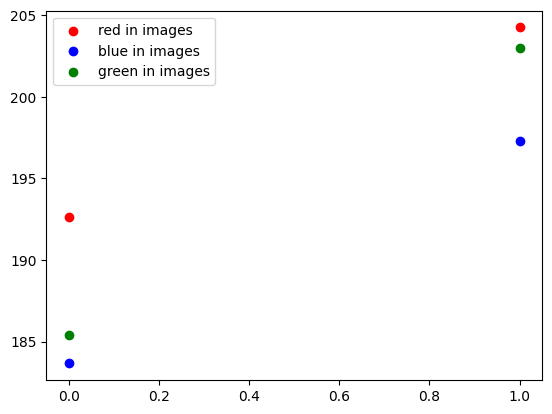

2-2


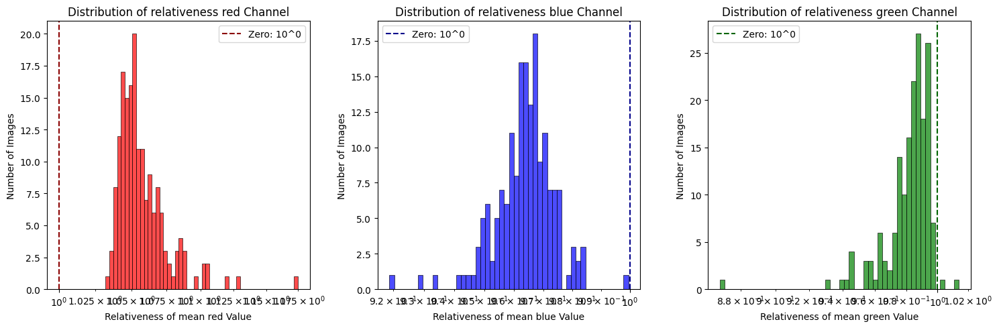

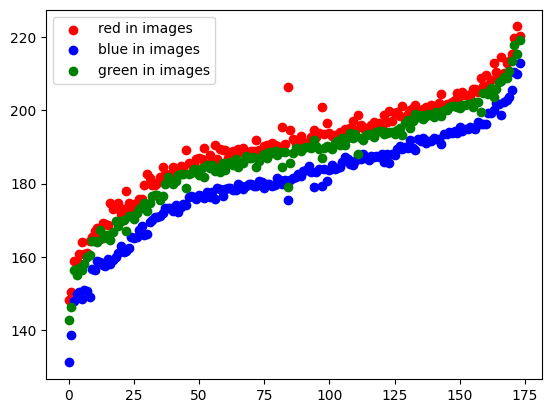

2-3


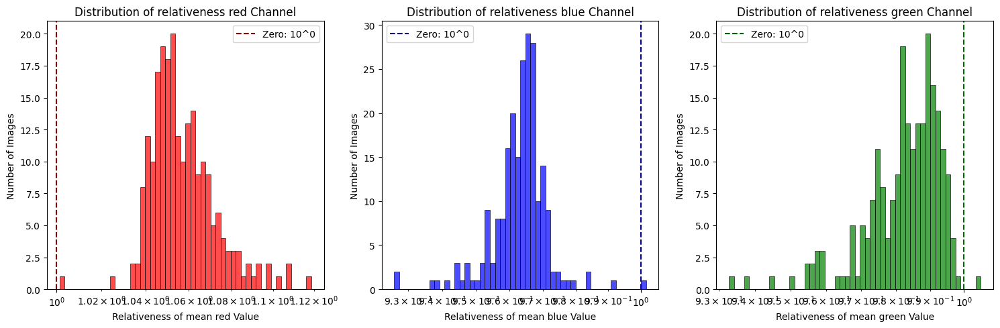

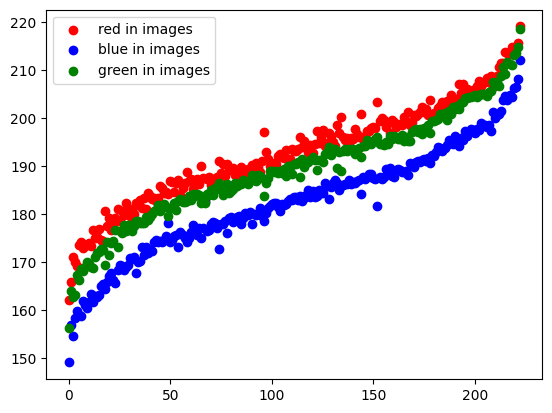

2-4


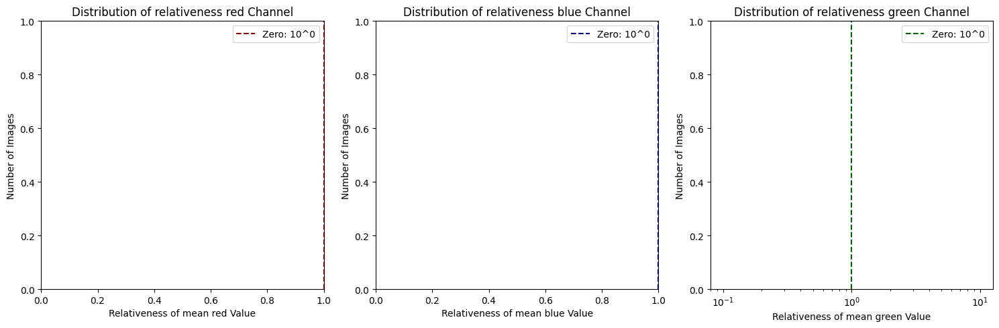

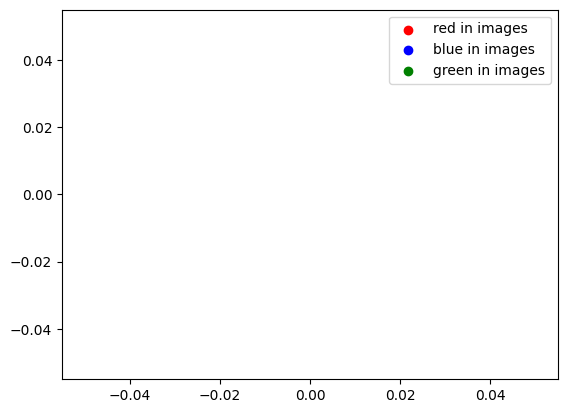

2-5


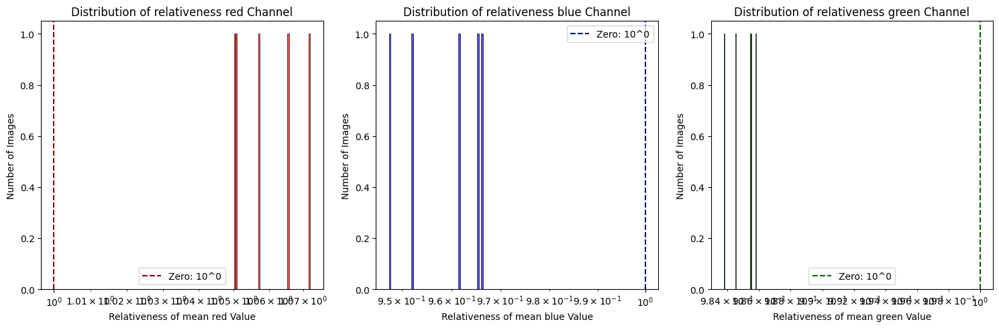

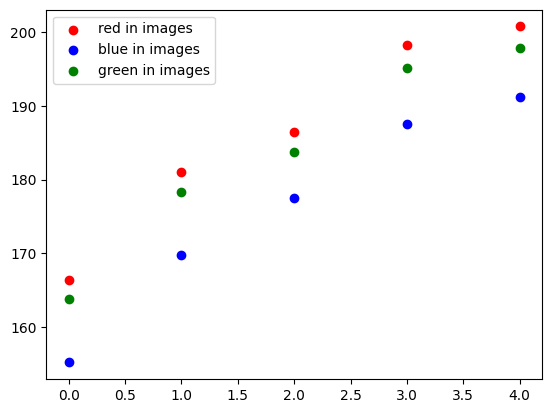

3-0


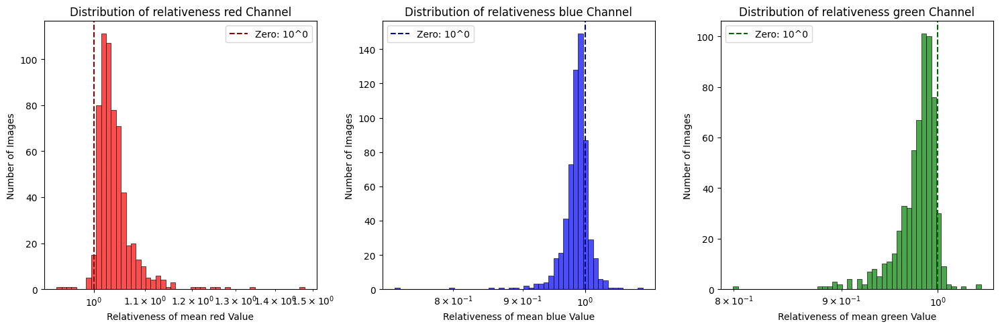

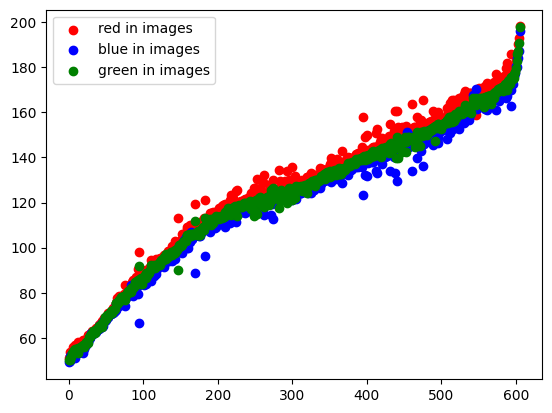

3-1


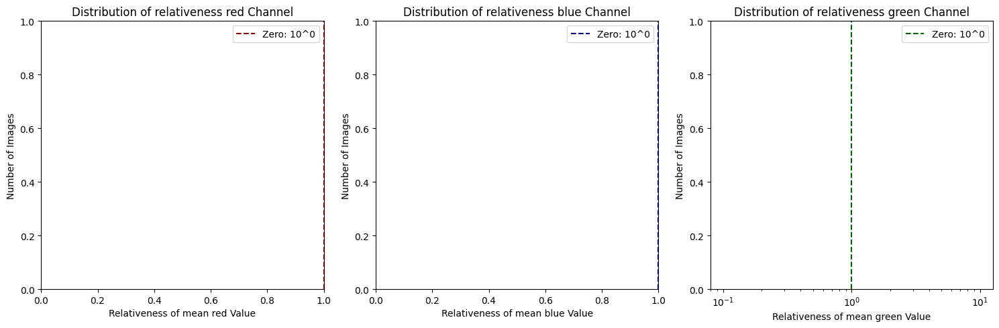

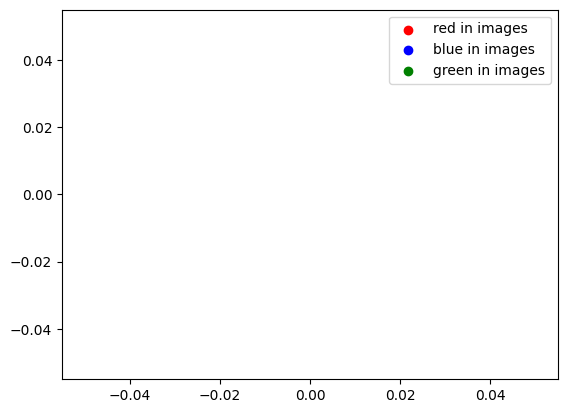

3-2


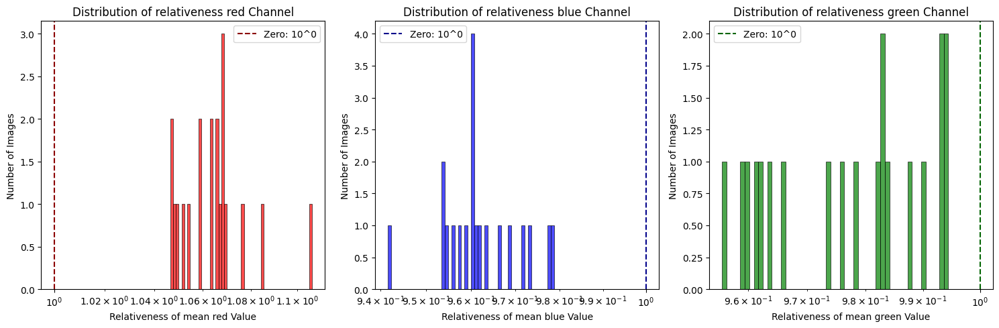

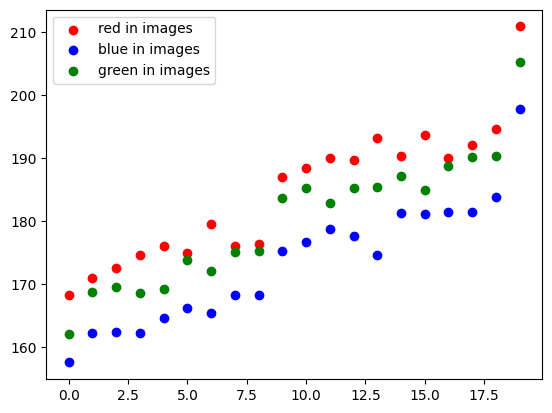

3-3


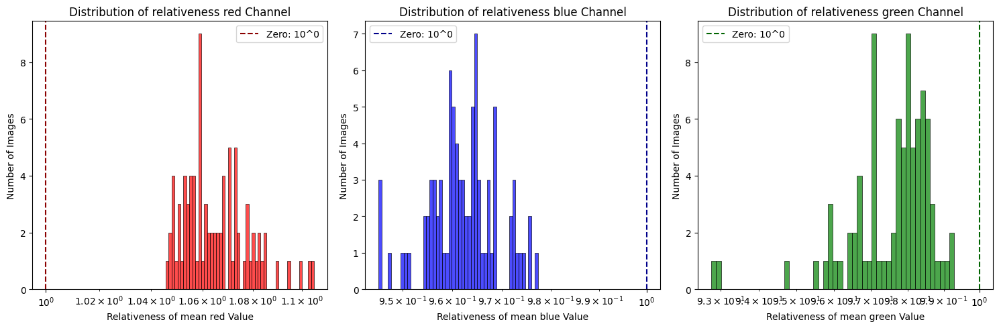

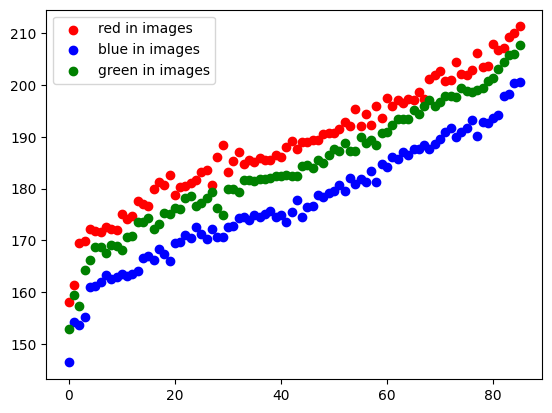

3-4


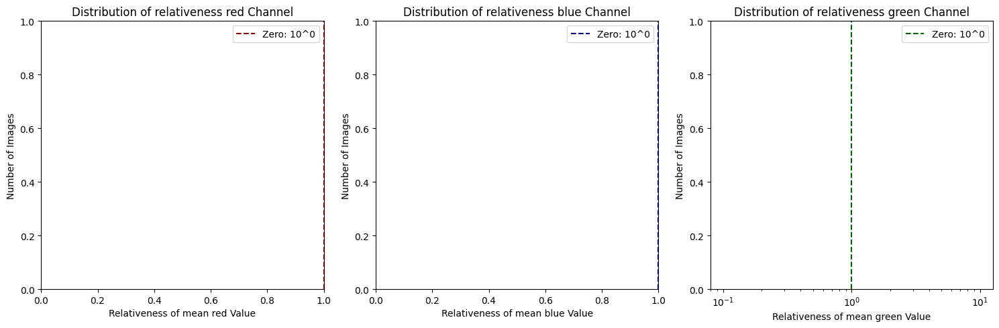

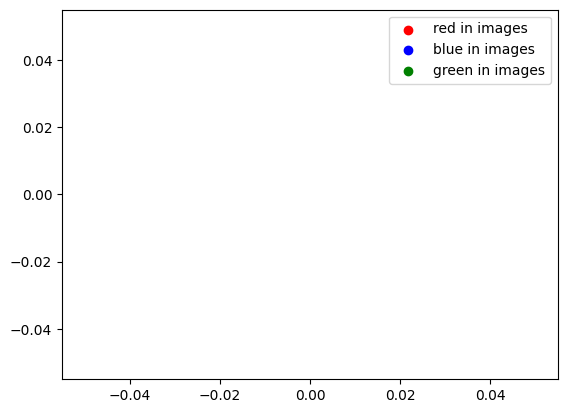

3-5


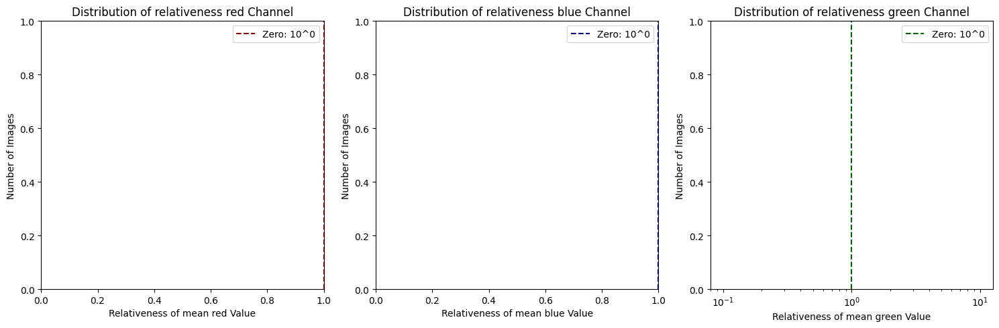

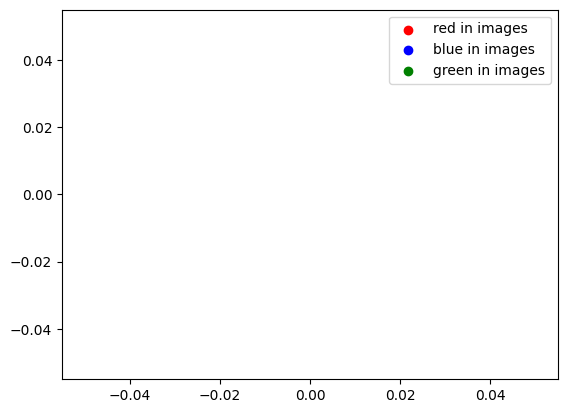

4-0


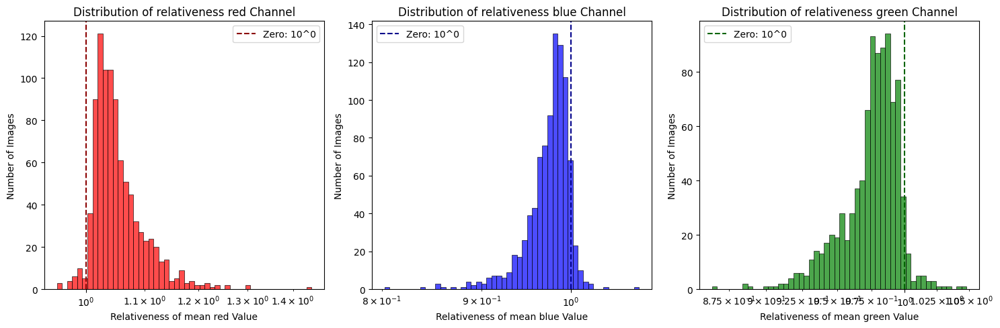

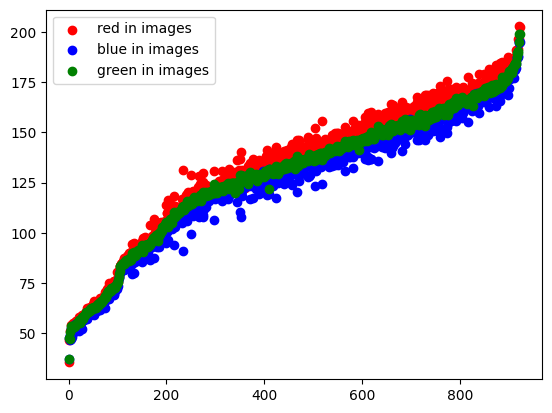

4-1


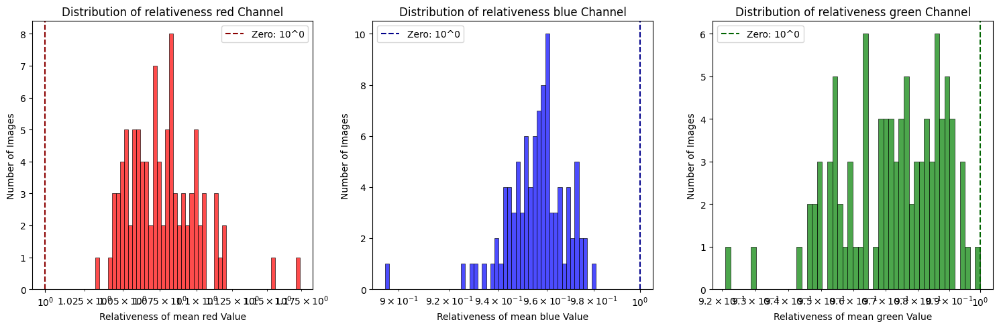

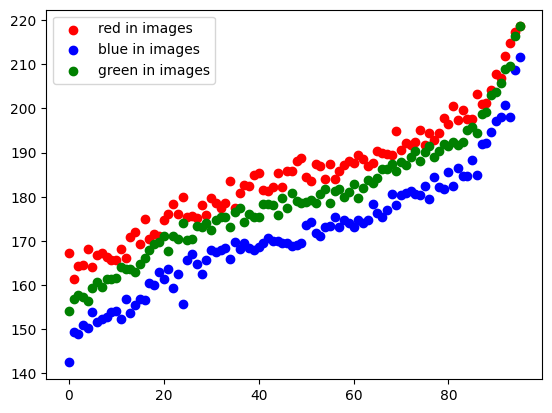

4-2


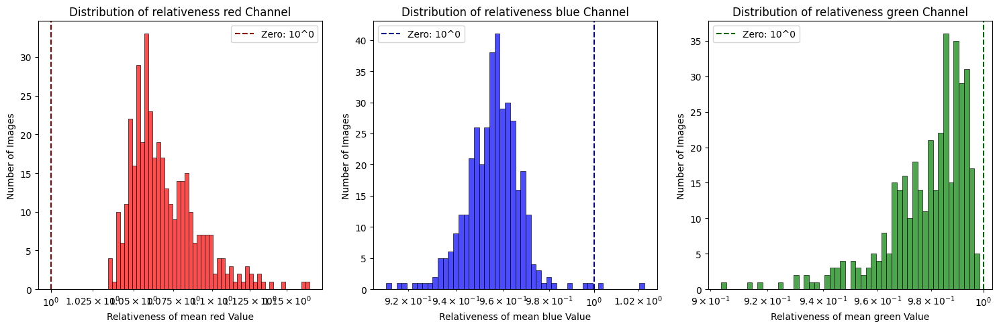

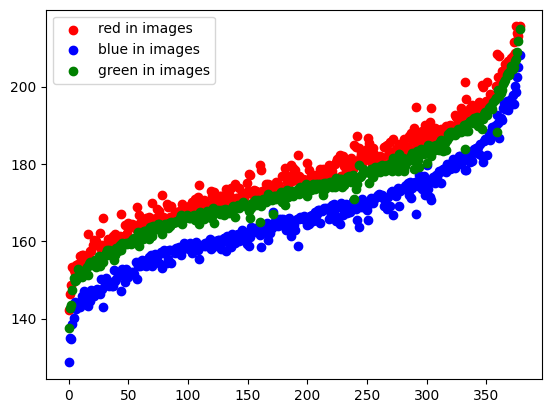

4-3


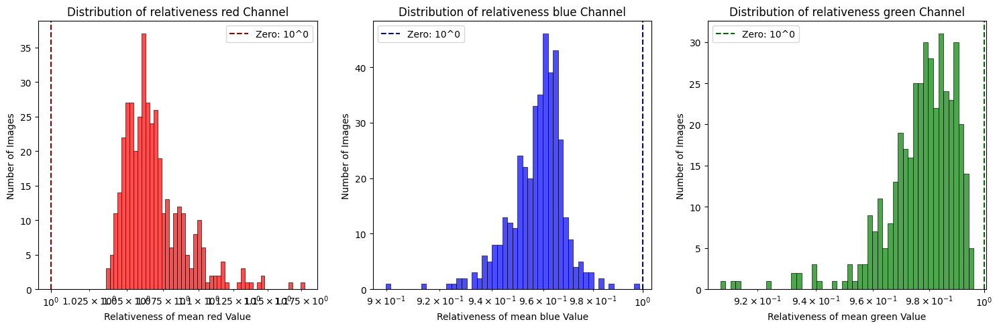

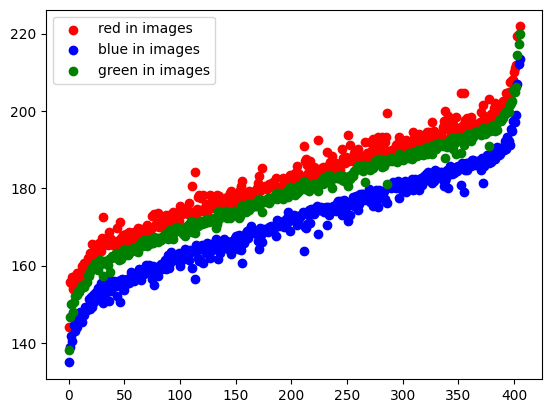

4-4


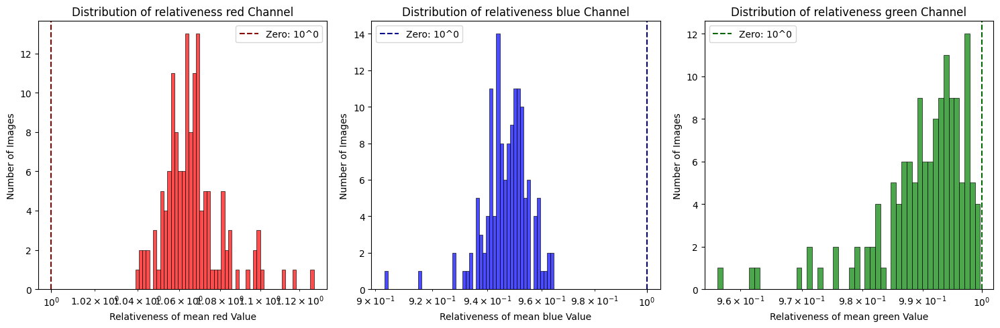

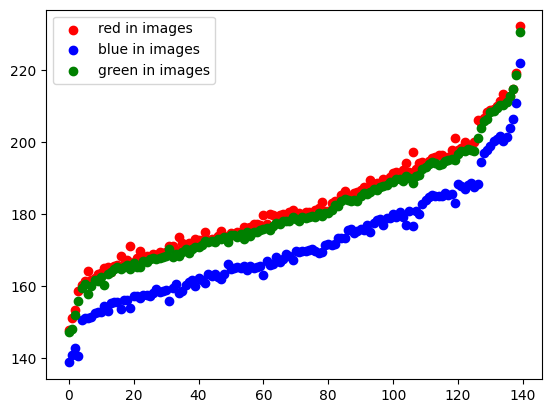

4-5


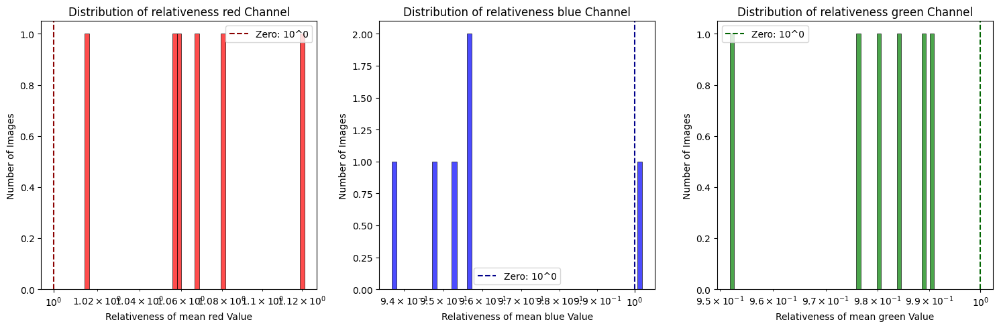

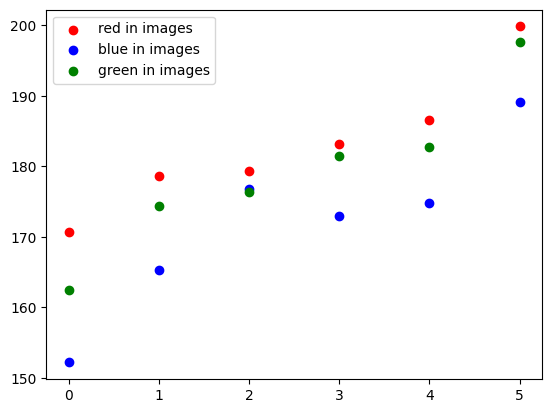

5-0


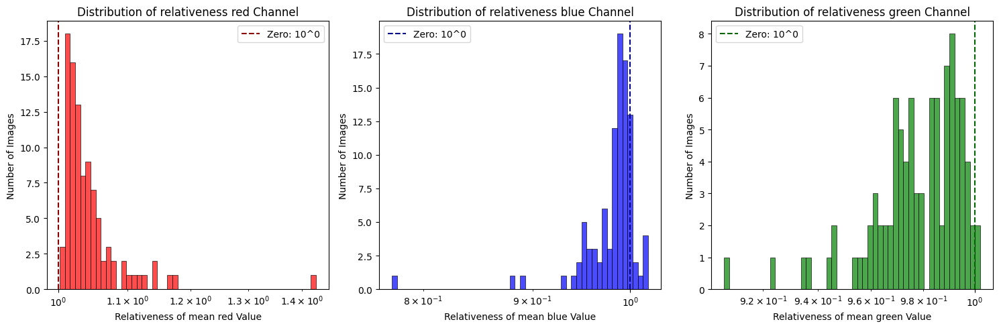

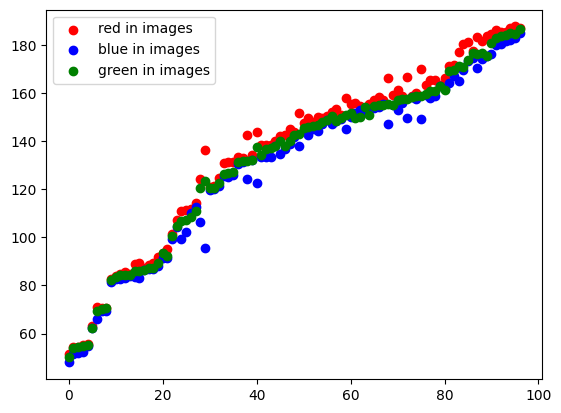

5-1


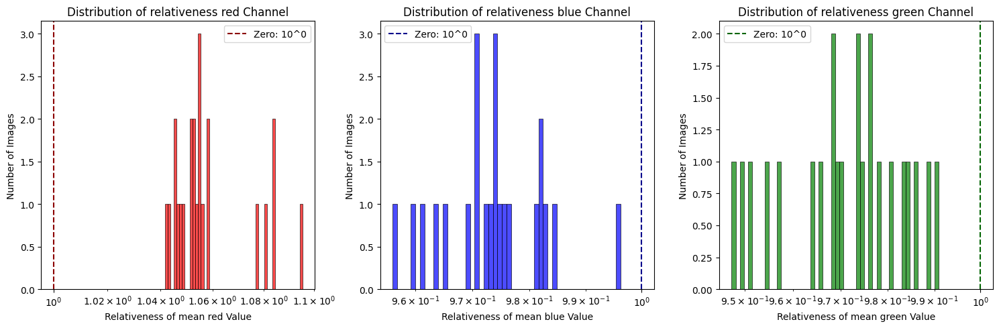

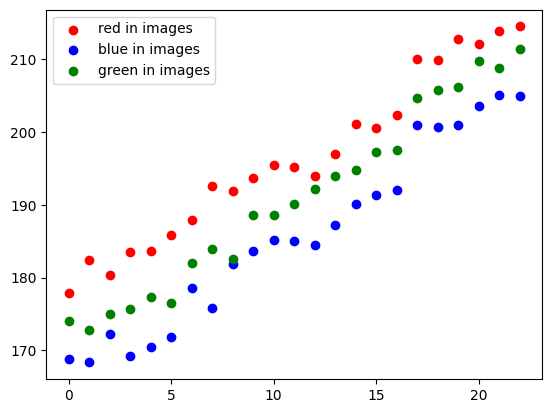

5-2


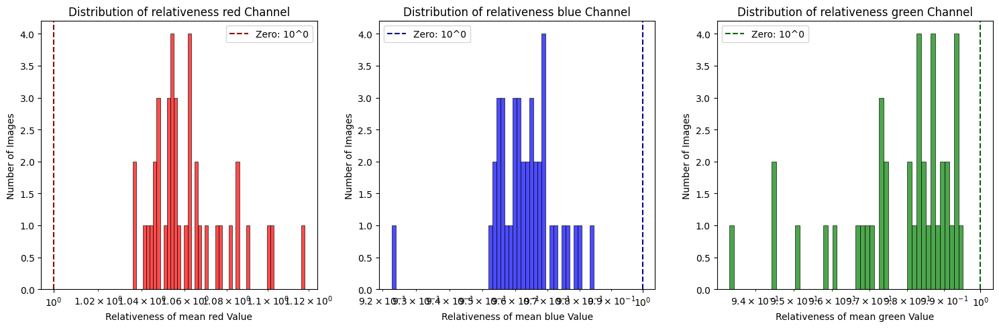

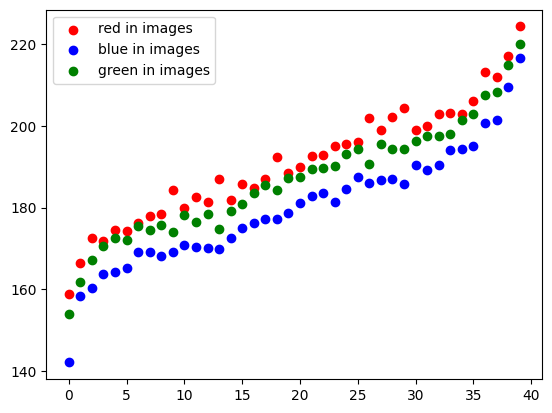

5-3


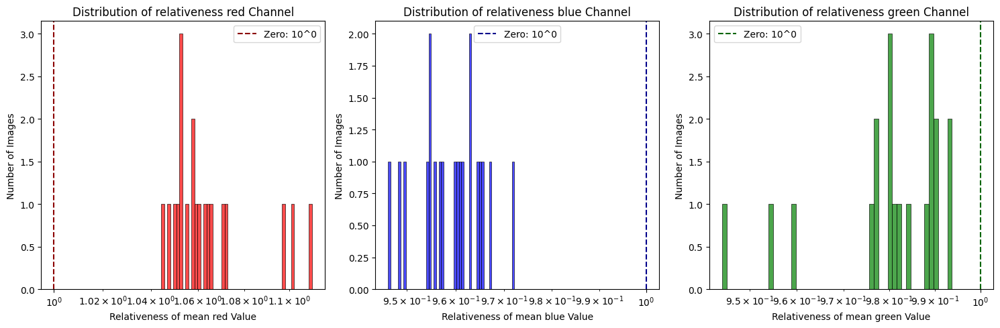

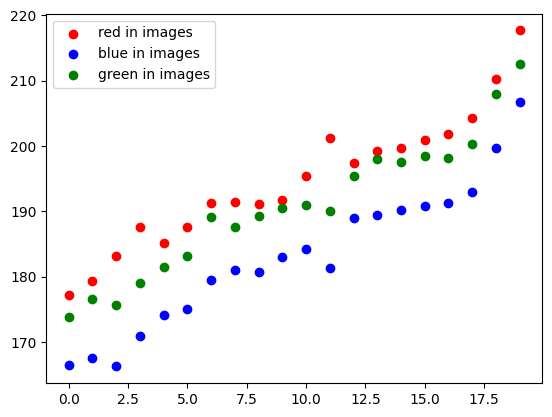

5-4


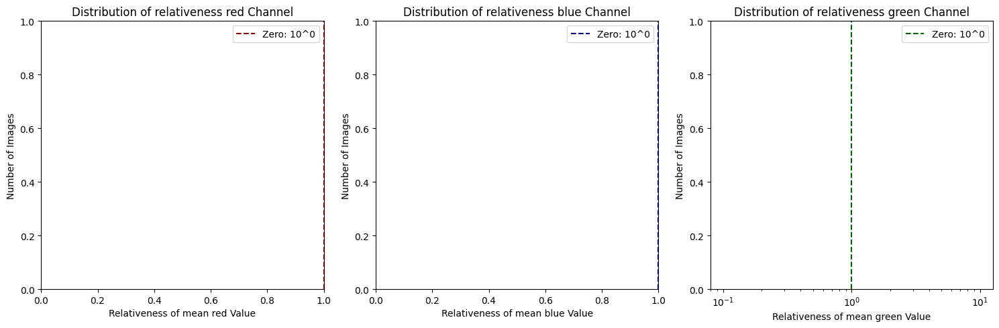

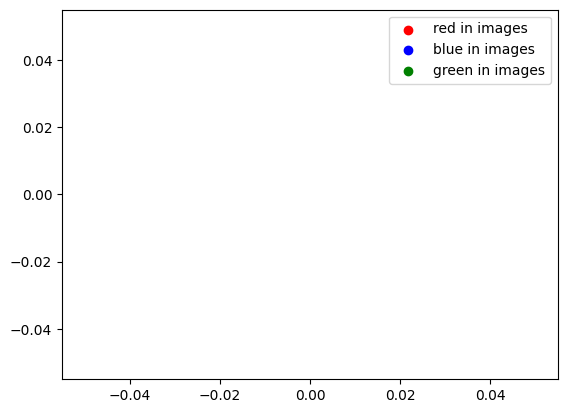

5-5


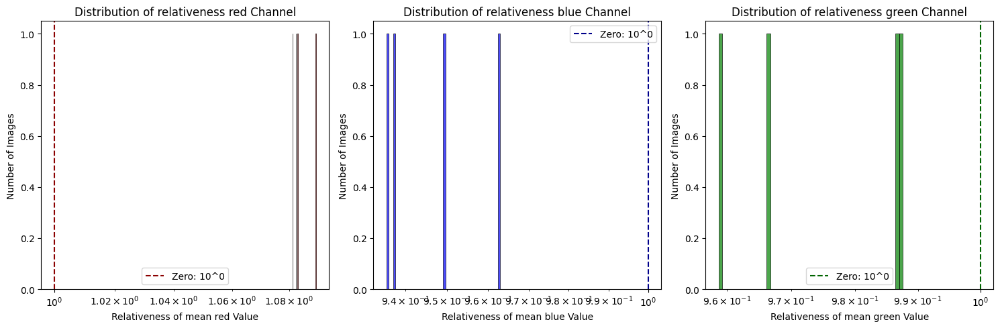

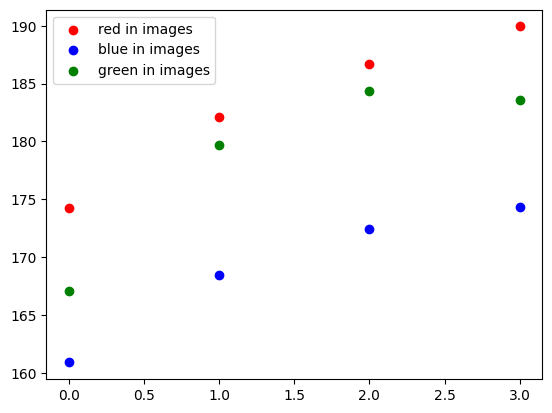

6-0


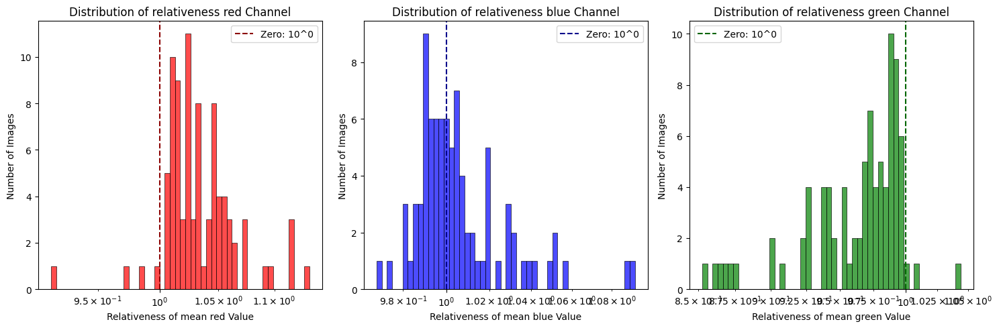

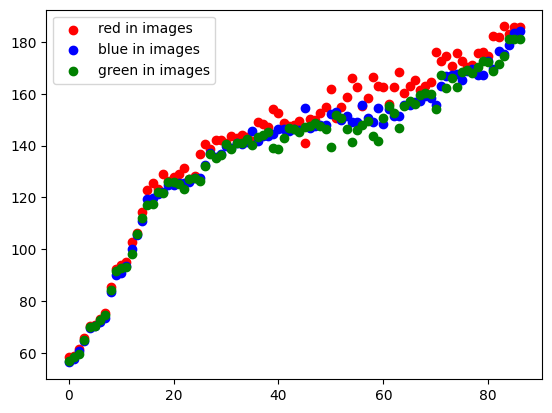

6-1


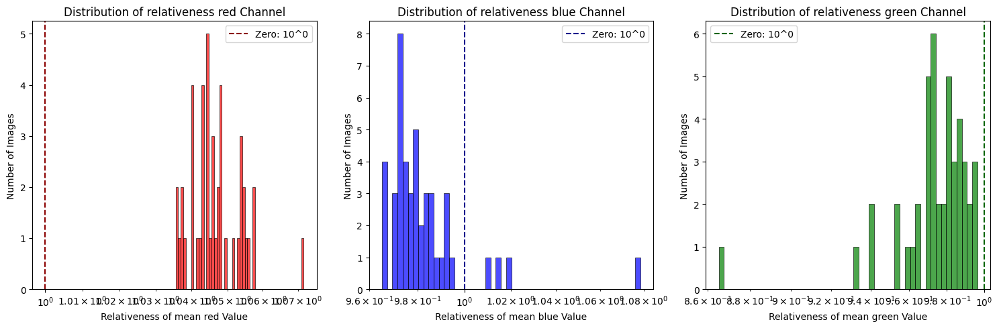

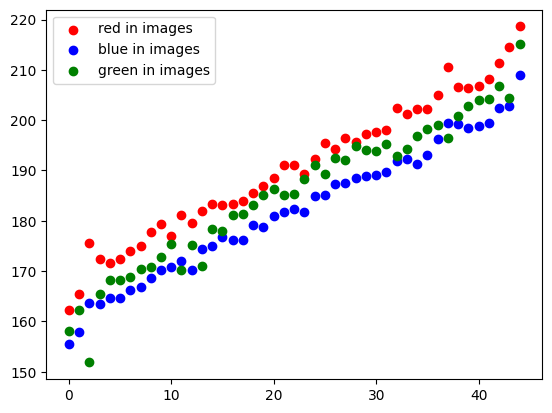

6-2


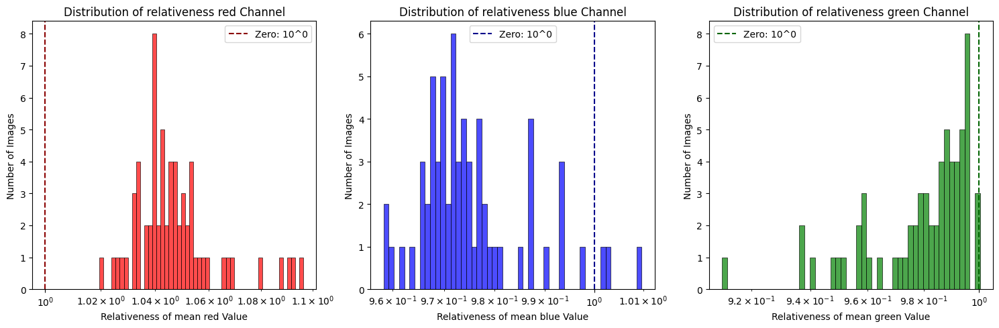

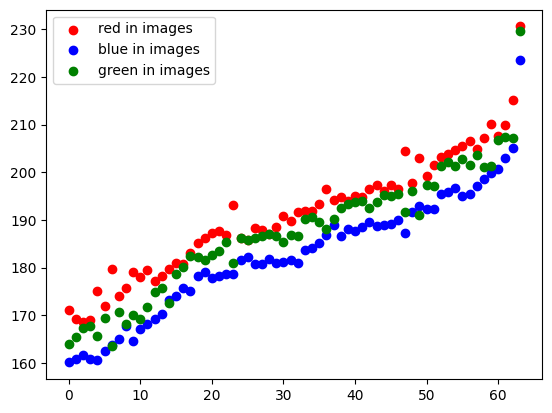

6-3


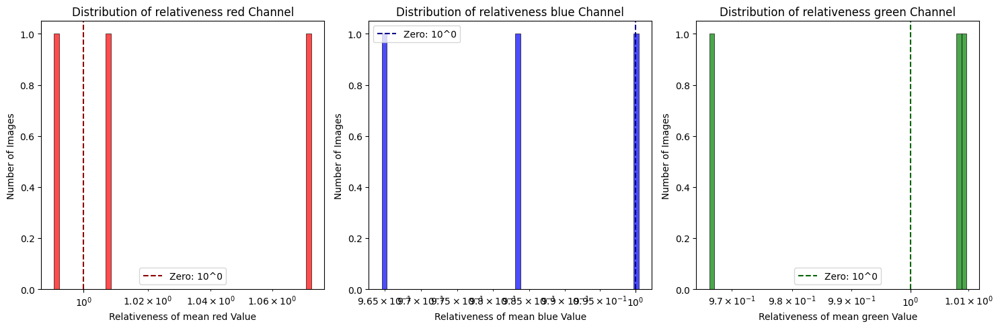

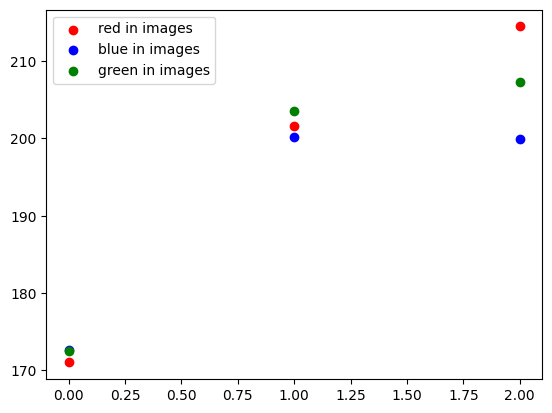

6-4


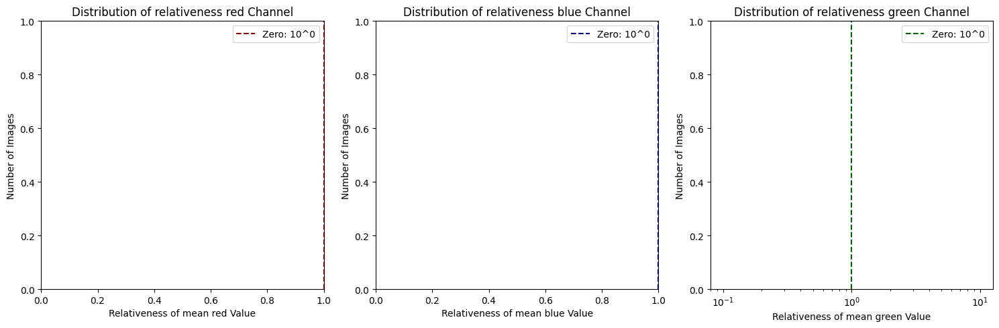

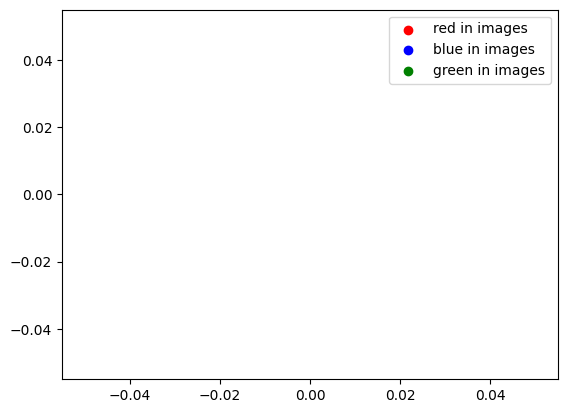

6-5


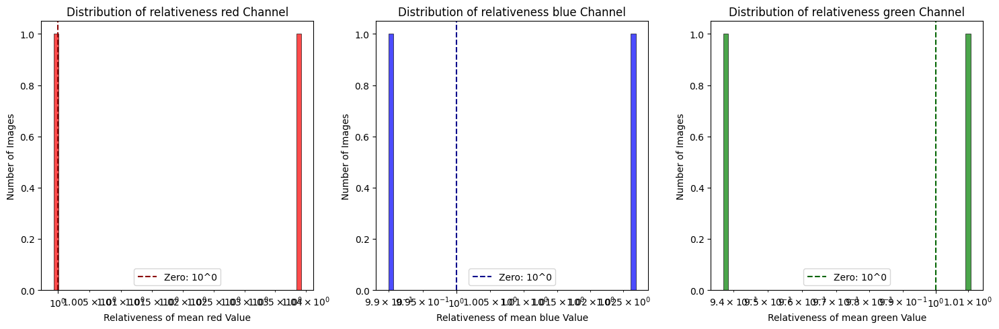

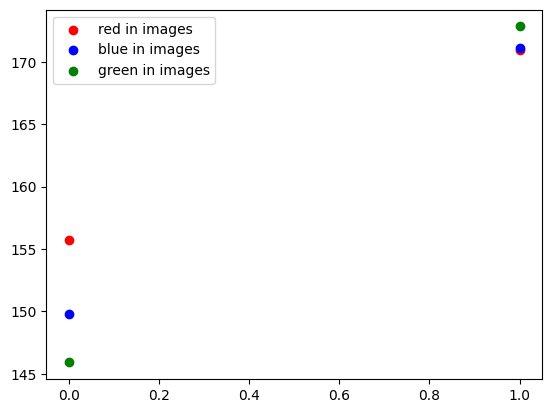

7-0


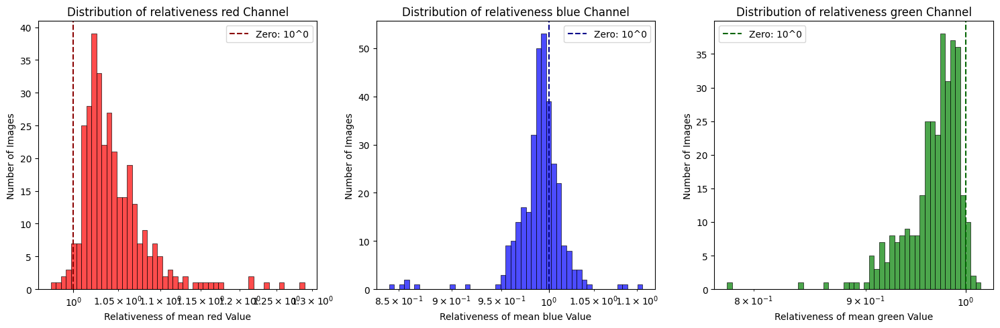

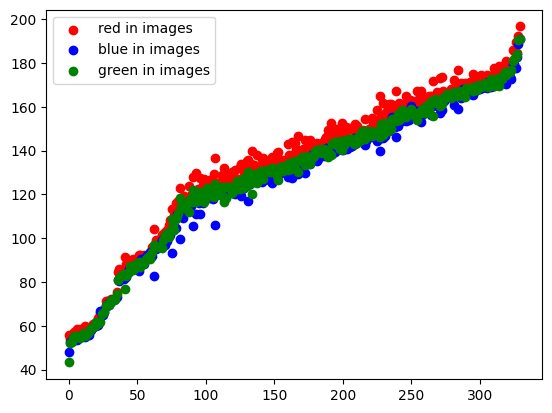

7-1


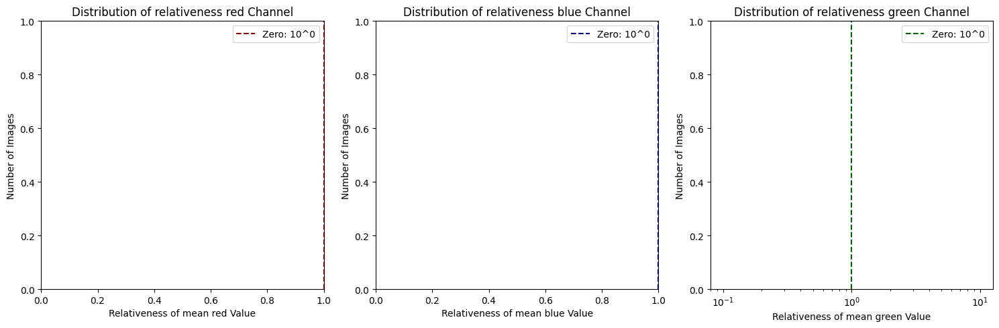

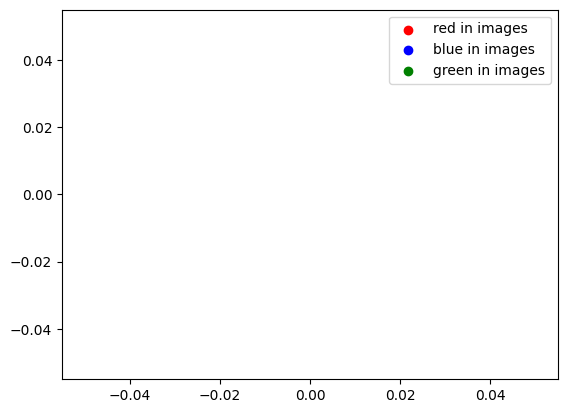

7-2


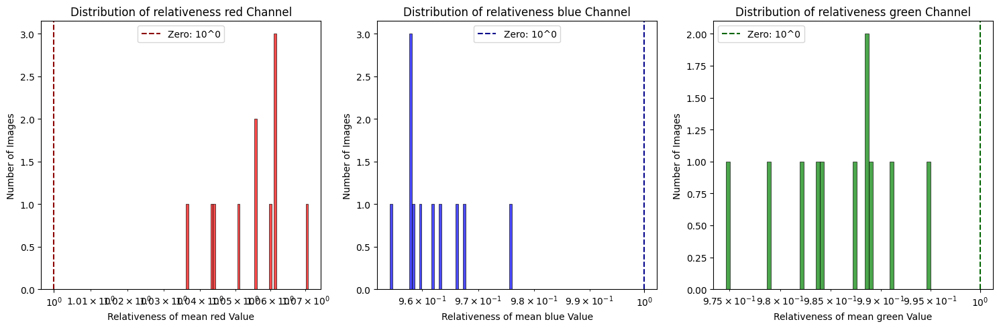

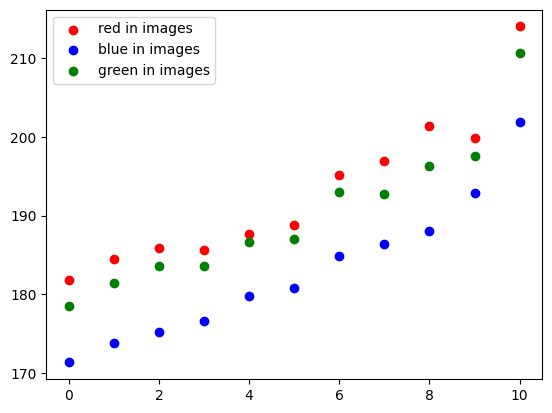

7-3


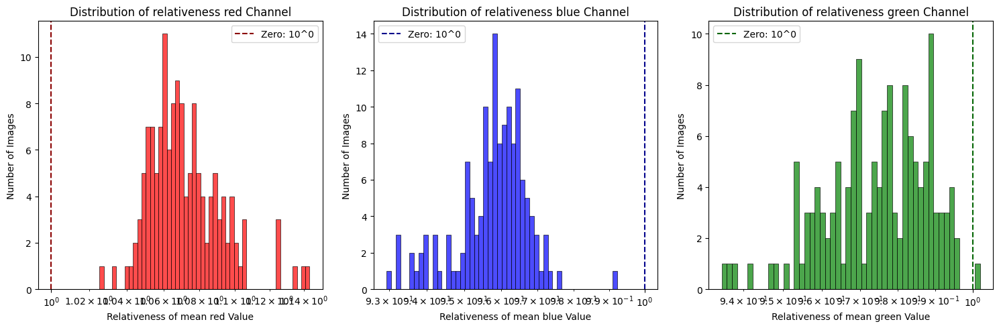

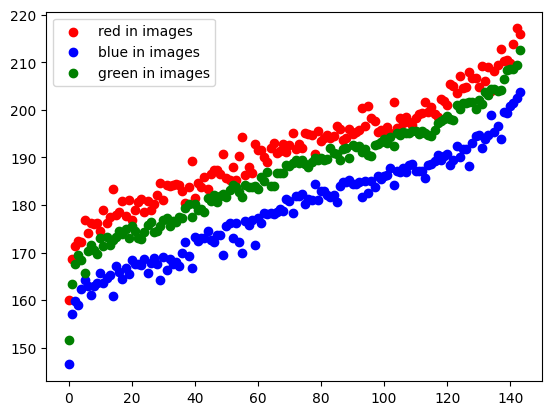

7-4


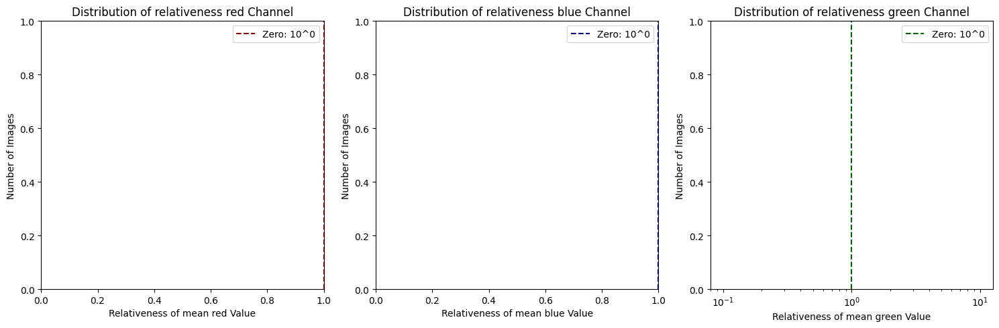

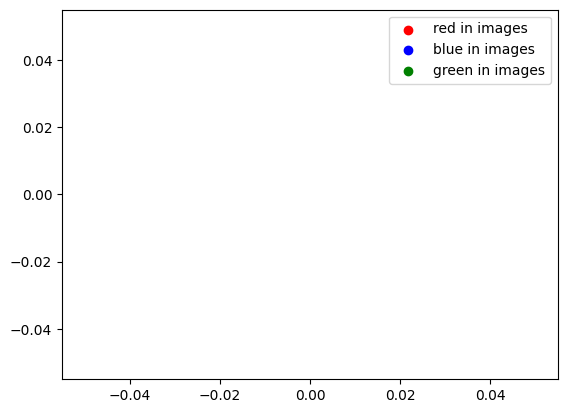

7-5


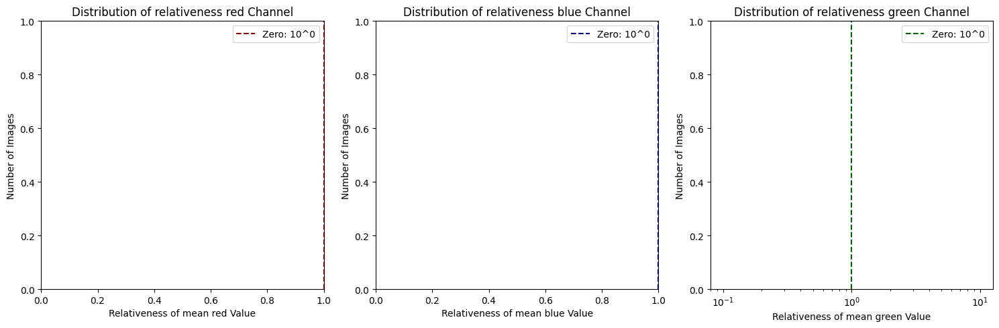

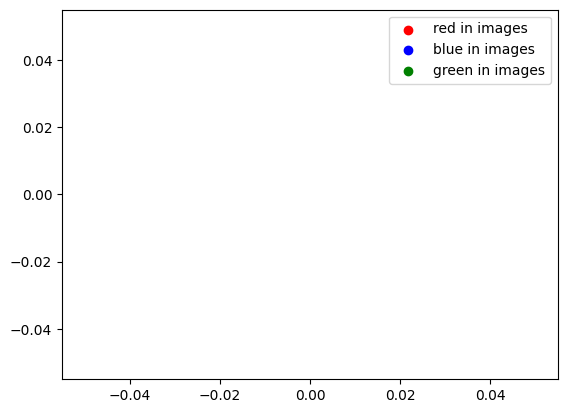

In [17]:
for label, label_name in enumerate(LABELS):
    for domain in data.center.unique():
        print("{}-{}".format(label_name, domain))
        eda.draw_color_distrib(*eda.get_color_rels(eda.single_generator(data, 'image', GROUP_COL, 'label', domain, label)))
        eda.draw_color_changes(*eda.get_colors(eda.sort_out_by_color(eda.single_generator(data, 'image', GROUP_COL, 'label', domain, label))))

Среди 1-2, 2-2, 3-0, 4-3, 6-0, 6-1, 6-2, 7-0 - синий цвет имел близкое к зеленному значение, или даже доминировал, будучи около нуля или больше, когда в остальных случаях находился меньше зеленного.

Опять же, цвет является существенным признаком, поэтому его как-то менять не стоит. Хотя если менять каналы местами, то можно посмотреть, сможет ли модель хорошо распознавать изображения по тому, как отличается цвет относительно фона (цвета кожи). Но на это нужно еще посмотреть глазами, чтобы сказать, не будет ли потеряна информация.

по поводу второго вида графиков - отедльно по классам и по центрам я максимум нашла картину "дождя", когда основная масса цветов находится в одной зоне, но есть выборсы ниже. Например как на примере:
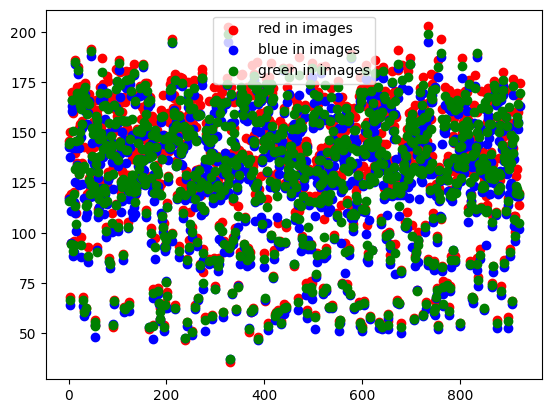

Но их не то чтобы единицы, опять оможет быть из-за черного цвета (можно глянуть когда поправлю этот момент)

При сортировке по яркости можно еще явно увидеть паттерн. Например для 1, 2 и 4 лейбла в некоторых центрах средний синий явно ниже остальных цветов, но в первом датацентре синий цвет сравним с зеленым. Возможно опять же из замощения бежевым (там синий цвет меньше остальных) + сама кожа бежевого цвета. В первом датацентре все же много черного.

Также кажется что большинство самых темных и светлых изображений приходится на первых центр.

Можно посмотреть также на пару обученных моделей к датасету. Я нашла, что densenet121 можно использовать в качестве модели для медицины, например есть исследования про ее использовании для определения рака легкий, а в соревновании про родинки люди тоже ее использовали.

In [39]:
import psutil
import torch
device = torch.device('cpu')
torch.set_num_threads(min(20, psutil.cpu_count()))

In [ ]:
# Usage
model = eda.models.densenet121(weights=None)
model.classifier = eda.nn.Linear(model.classifier.in_features, len(LABELS))

transform = eda.transforms.Compose([
        eda.transforms.ToTensor(),
        eda.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

train_loader, val_loader = eda.create_cpu_friendly_dataloaders(data.sample(frac=0.3), transform)
eda.cpu_friendly_train(device, model, train_loader, val_loader, epochs=4)

NameError: name 'eda' is not defined

на малых количествах эпох и полном датасете модель угадывает 60% валидационной выборки (в коде этого сейчас не весь датасет передается в модель, на случай, если кто-то запустит. Лучше смотреть в файлы long_model_execution.py и check_progres.py). На 20 эпохах модель запускалась обучаться в указанных файлах. Результаты:

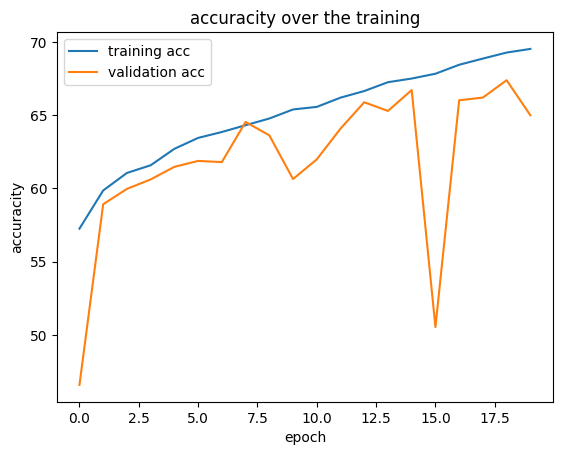
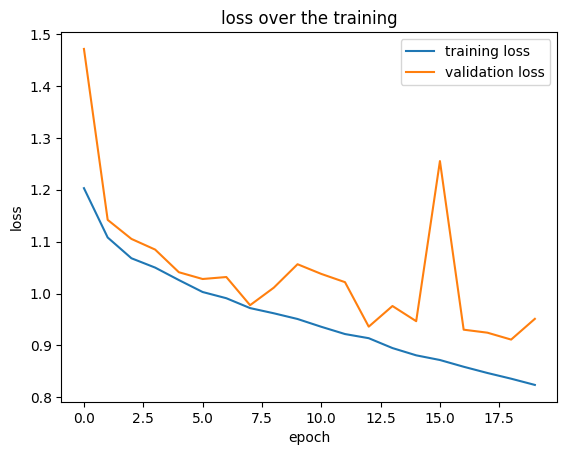

на 20 эпохах точность также около 60%. val loss еще не так сильно отклоняется от train loss к концу эпох, но учится медленно. Можно посмотреть насколько модель смогла обощить данные на данный момент.

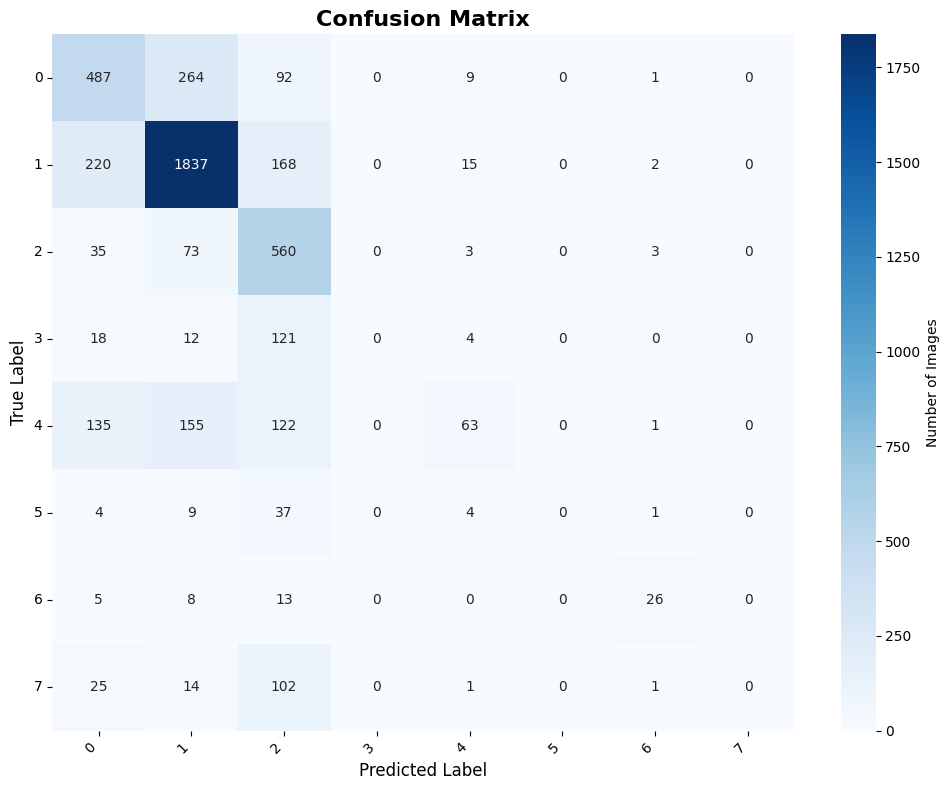

array([[ 487,  264,   92,    0,    9,    0,    1,    0],
       [ 220, 1837,  168,    0,   15,    0,    2,    0],
       [  35,   73,  560,    0,    3,    0,    3,    0],
       [  18,   12,  121,    0,    4,    0,    0,    0],
       [ 135,  155,  122,    0,   63,    0,    1,    0],
       [   4,    9,   37,    0,    4,    0,    1,    0],
       [   5,    8,   13,    0,    0,    0,   26,    0],
       [  25,   14,  102,    0,    1,    0,    1,    0]])

0:


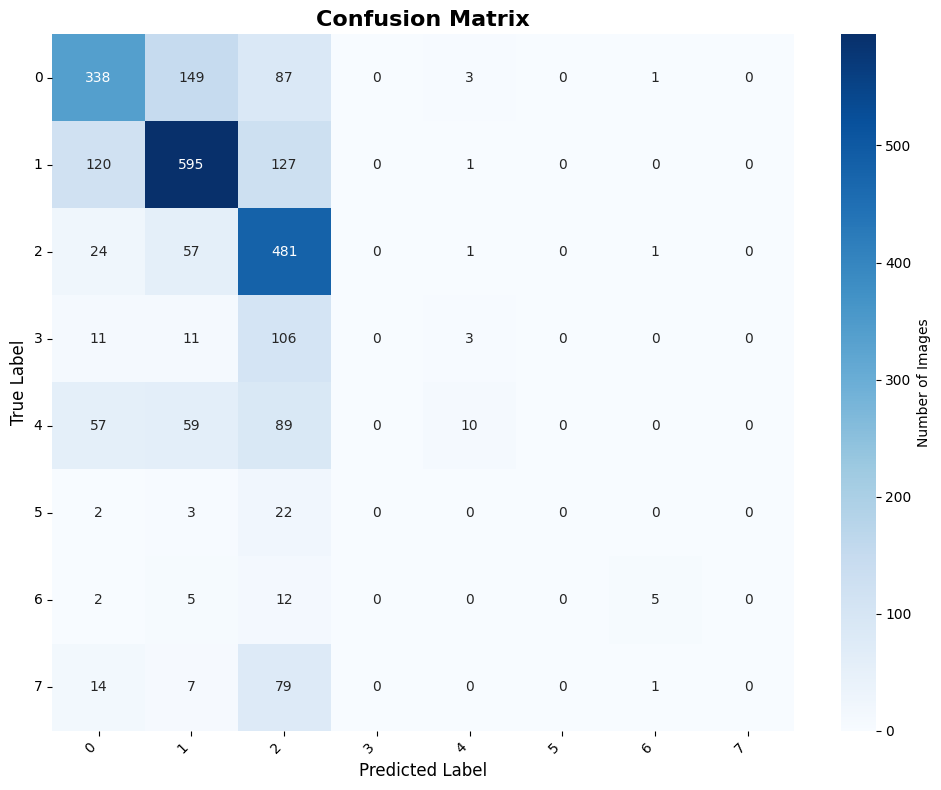

array([[338, 149,  87,   0,   3,   0,   1,   0],
       [120, 595, 127,   0,   1,   0,   0,   0],
       [ 24,  57, 481,   0,   1,   0,   1,   0],
       [ 11,  11, 106,   0,   3,   0,   0,   0],
       [ 57,  59,  89,   0,  10,   0,   0,   0],
       [  2,   3,  22,   0,   0,   0,   0,   0],
       [  2,   5,  12,   0,   0,   0,   5,   0],
       [ 14,   7,  79,   0,   0,   0,   1,   0]])

1:


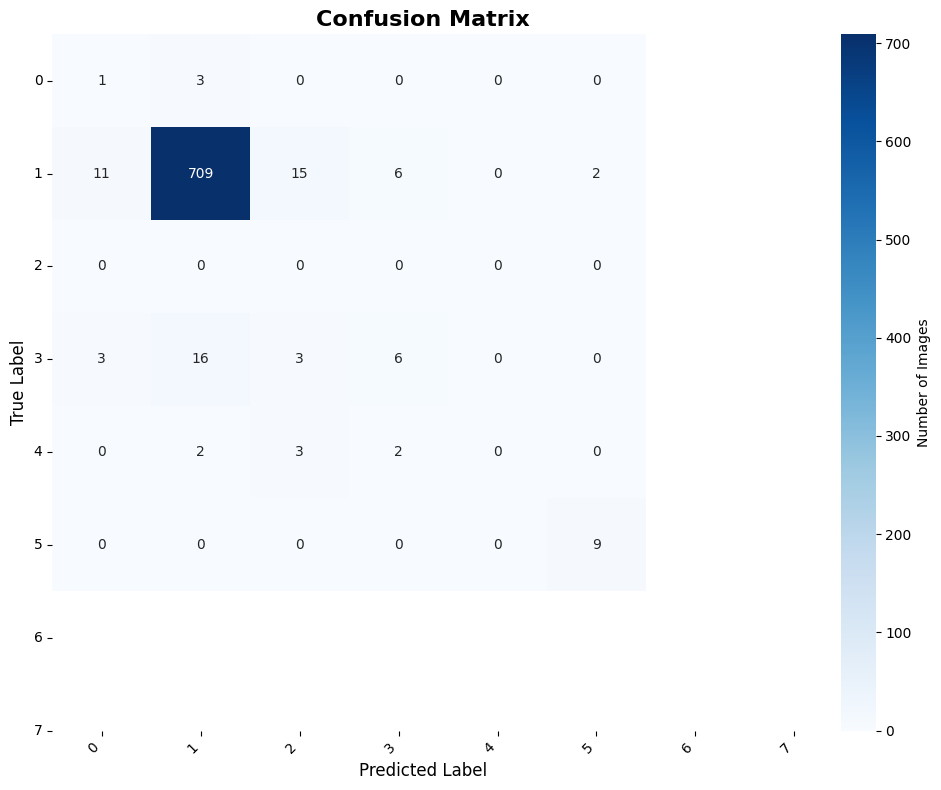

array([[  1,   3,   0,   0,   0,   0],
       [ 11, 709,  15,   6,   0,   2],
       [  0,   0,   0,   0,   0,   0],
       [  3,  16,   3,   6,   0,   0],
       [  0,   2,   3,   2,   0,   0],
       [  0,   0,   0,   0,   0,   9]])

2:


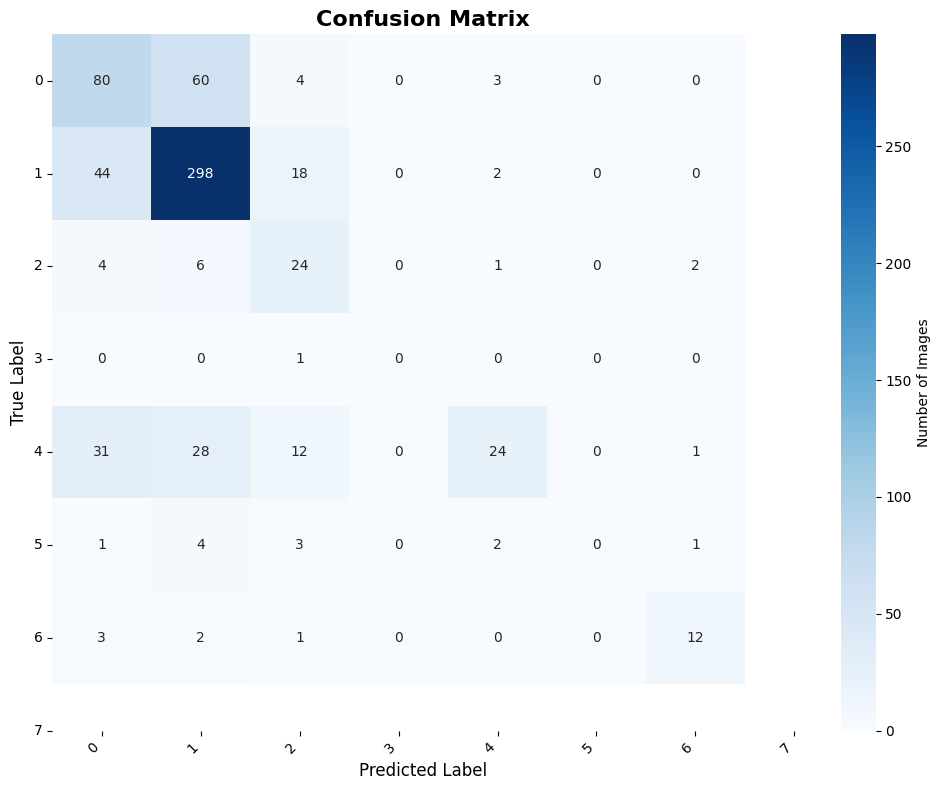

array([[ 80,  60,   4,   0,   3,   0,   0],
       [ 44, 298,  18,   0,   2,   0,   0],
       [  4,   6,  24,   0,   1,   0,   2],
       [  0,   0,   1,   0,   0,   0,   0],
       [ 31,  28,  12,   0,  24,   0,   1],
       [  1,   4,   3,   0,   2,   0,   1],
       [  3,   2,   1,   0,   0,   0,  12]])

3:


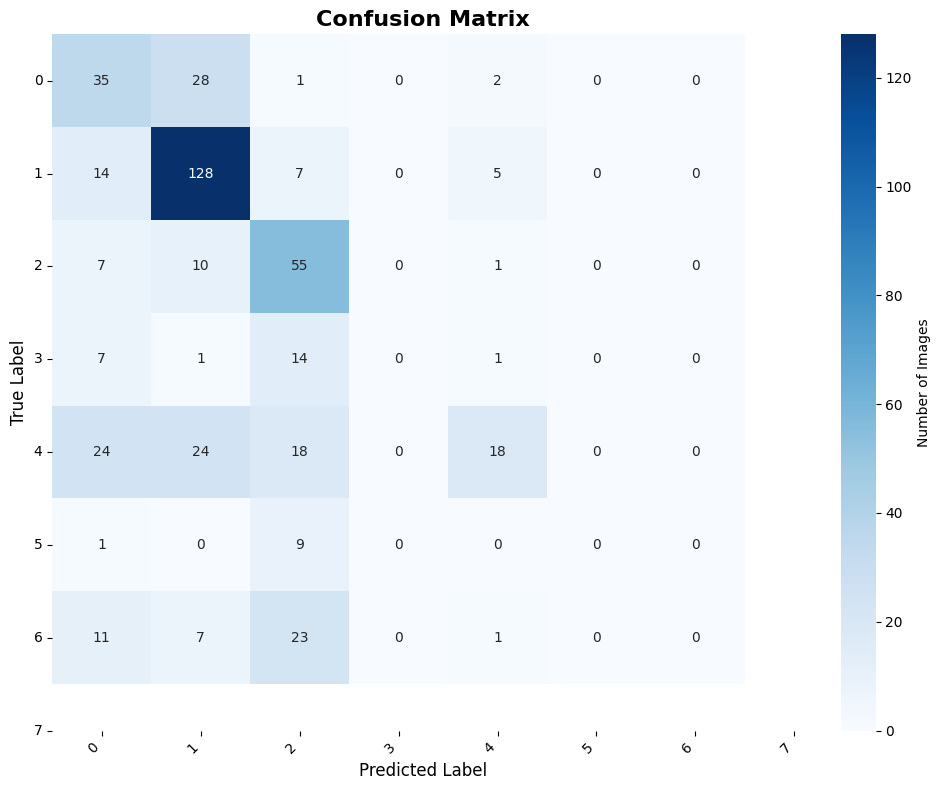

array([[ 35,  28,   1,   0,   2,   0,   0],
       [ 14, 128,   7,   0,   5,   0,   0],
       [  7,  10,  55,   0,   1,   0,   0],
       [  7,   1,  14,   0,   1,   0,   0],
       [ 24,  24,  18,   0,  18,   0,   0],
       [  1,   0,   9,   0,   0,   0,   0],
       [ 11,   7,  23,   0,   1,   0,   0]])

4:


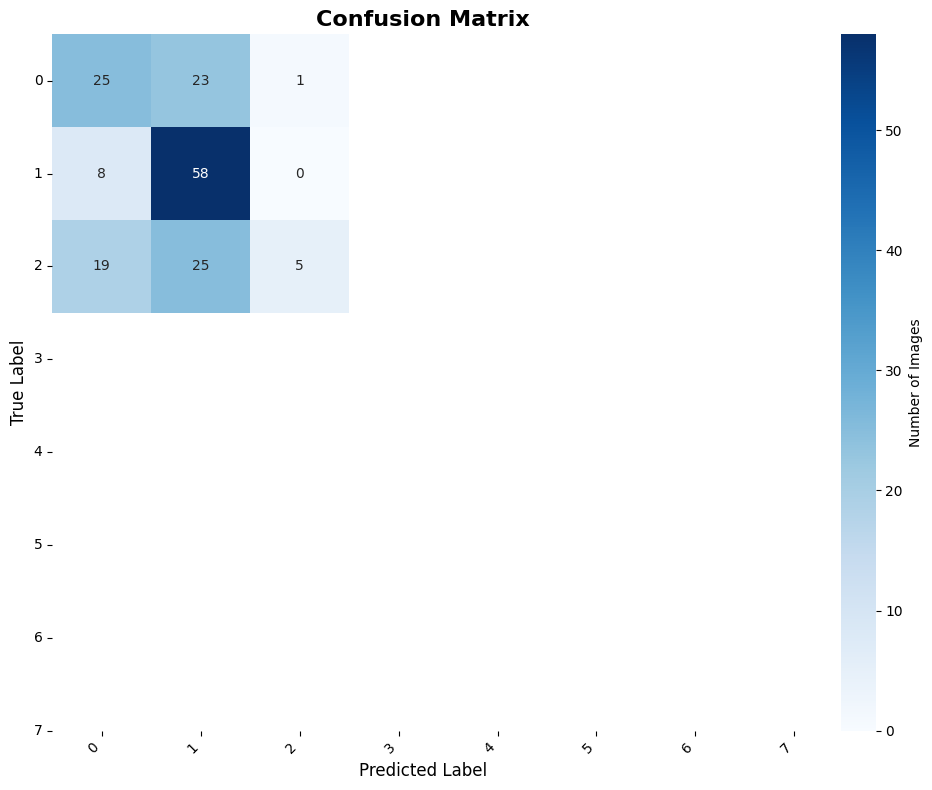

array([[25, 23,  1],
       [ 8, 58,  0],
       [19, 25,  5]])

5:


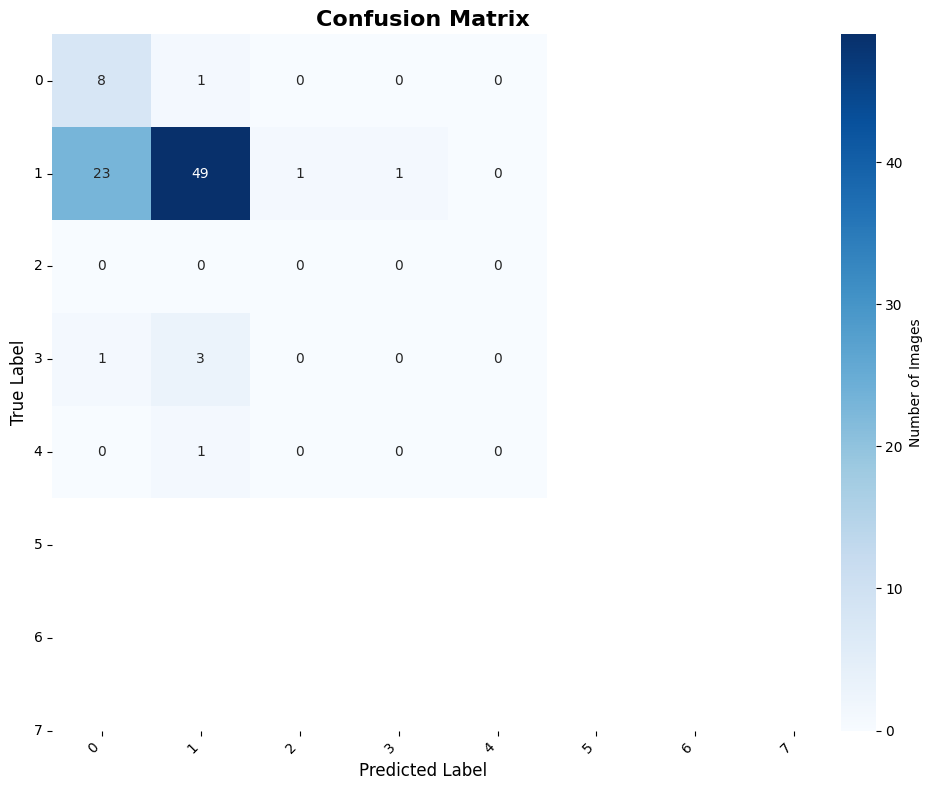

array([[ 8,  1,  0,  0,  0],
       [23, 49,  1,  1,  0],
       [ 0,  0,  0,  0,  0],
       [ 1,  3,  0,  0,  0],
       [ 0,  1,  0,  0,  0]])

In [41]:
data_test = eda.download_dataset(DATASET_PATH, 'test')
data_test['image'] = data_test['image'].map(lambda x: eda.resize_and_pad(x, (224, 224)))

val_test = eda.DataFrameImageDataset(data_test, "image", "label", transform)
val_loader = eda.DataLoader(val_test, batch_size=16, shuffle=False, num_workers=0, pin_memory=False)
predictions, targets, probabilities = eda.evaluate_model(model, val_loader, device)
cm = eda.plot_confusion_matrix(targets, predictions, LABELS)
display(cm)

for domain in DOMAIN:
    print(domain, end=':\n')
    val_test = eda.DataFrameImageDataset(data_test[data_test[GROUP_COL] == domain], "image", "label", transform)
    val_loader = eda.DataLoader(val_test, batch_size=16, shuffle=False, num_workers=0, pin_memory=False)
    
    
    predictions, targets, probabilities = eda.evaluate_model(model, val_loader, device)
    cm = eda.plot_confusion_matrix(targets, predictions, LABELS)
    display(cm)

на 20 эпохах (что делалось в других файлах) получаем похожую картину
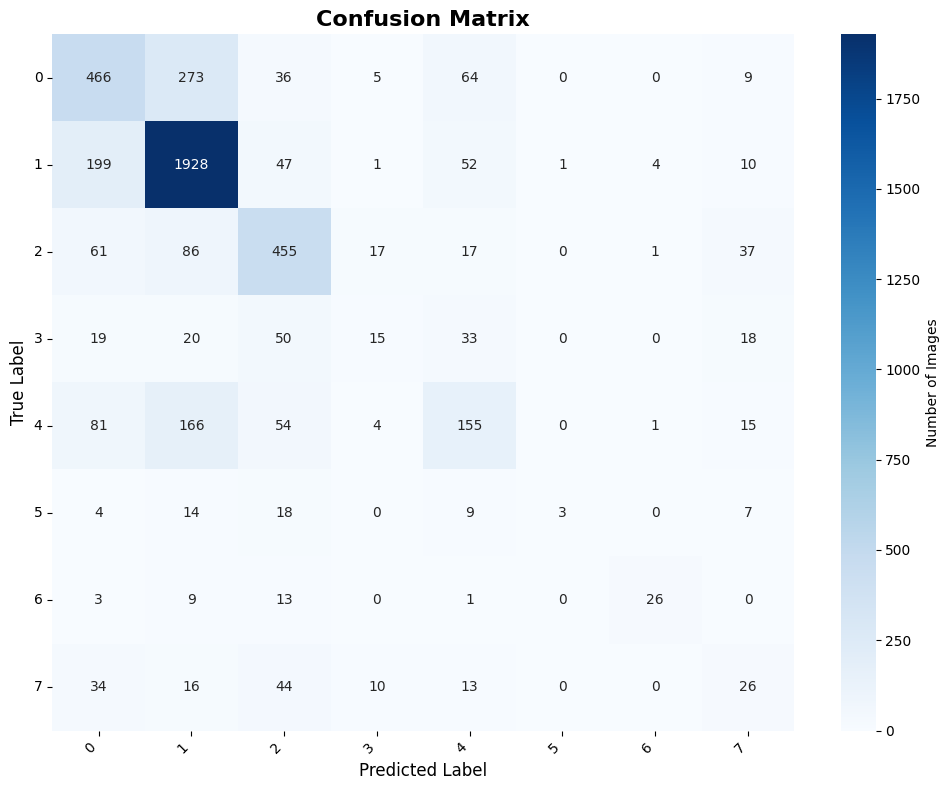
by center:
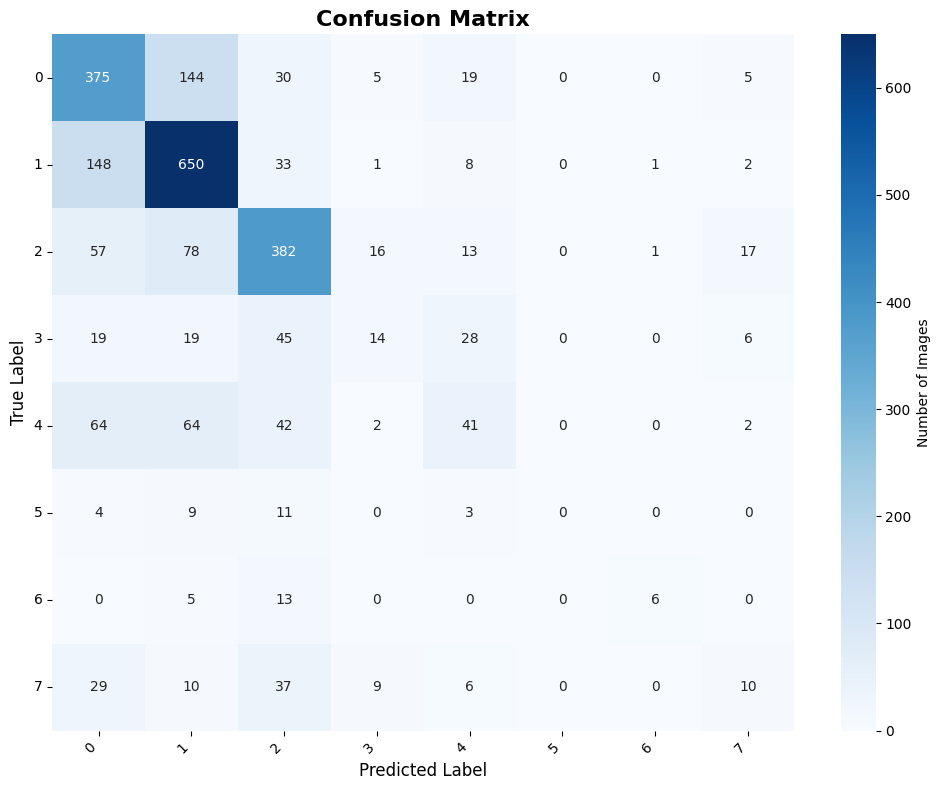
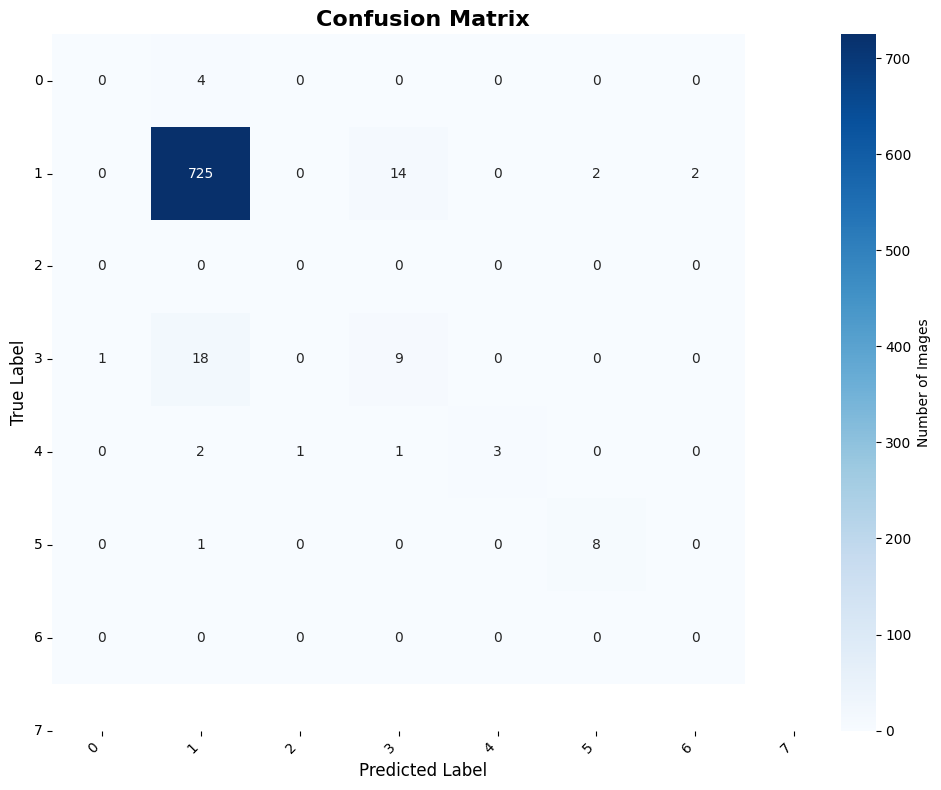
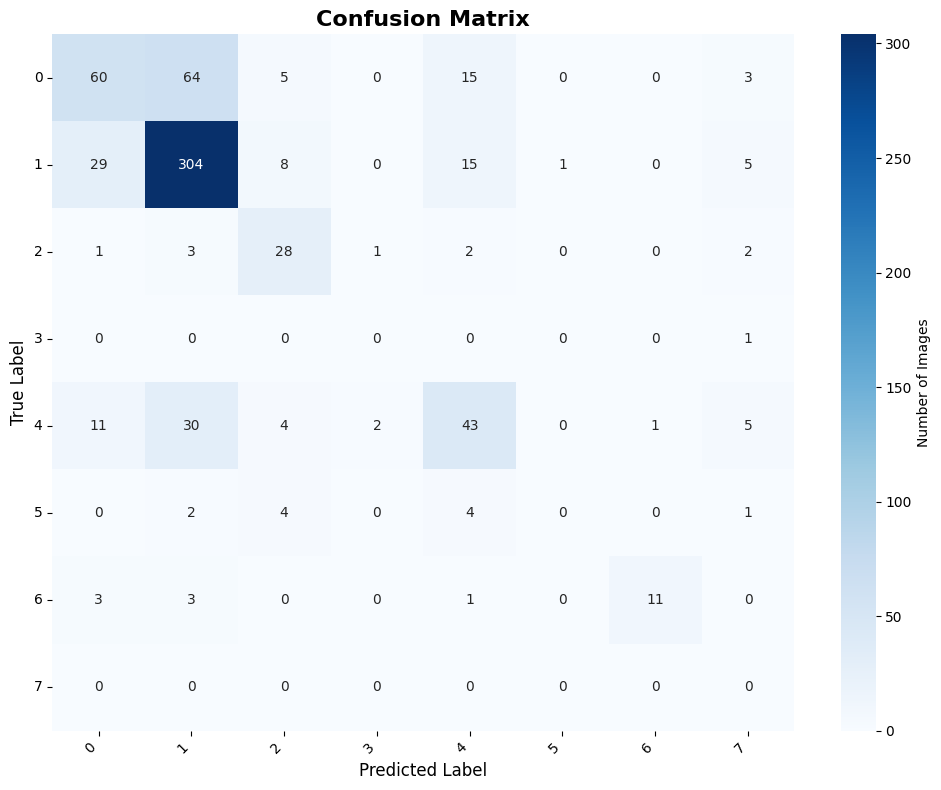
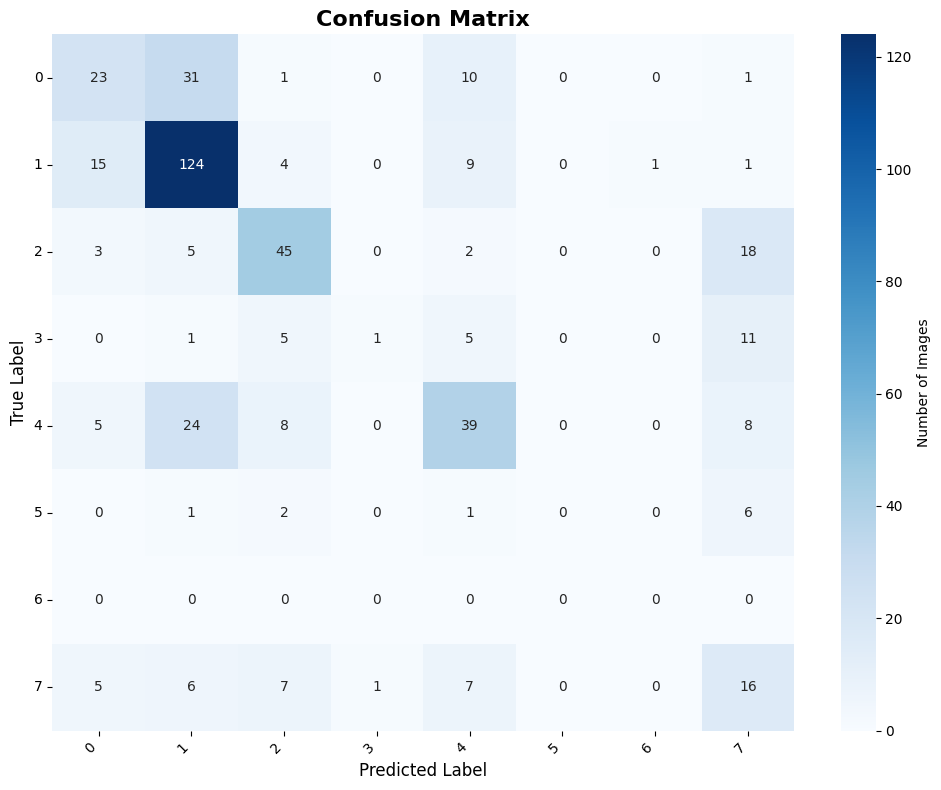
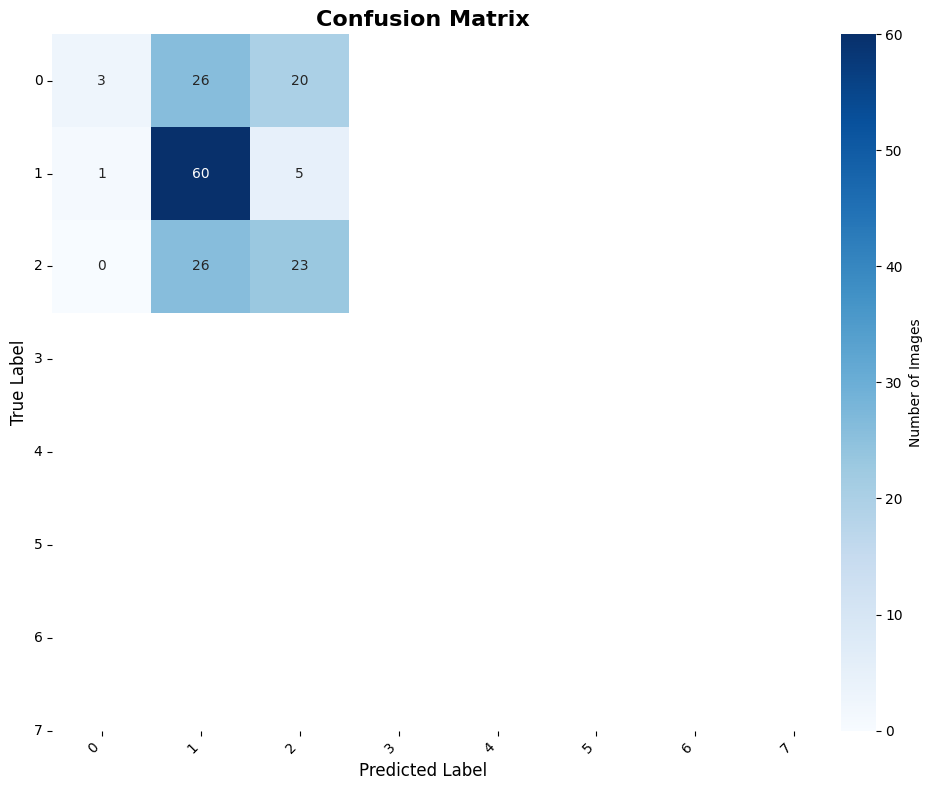
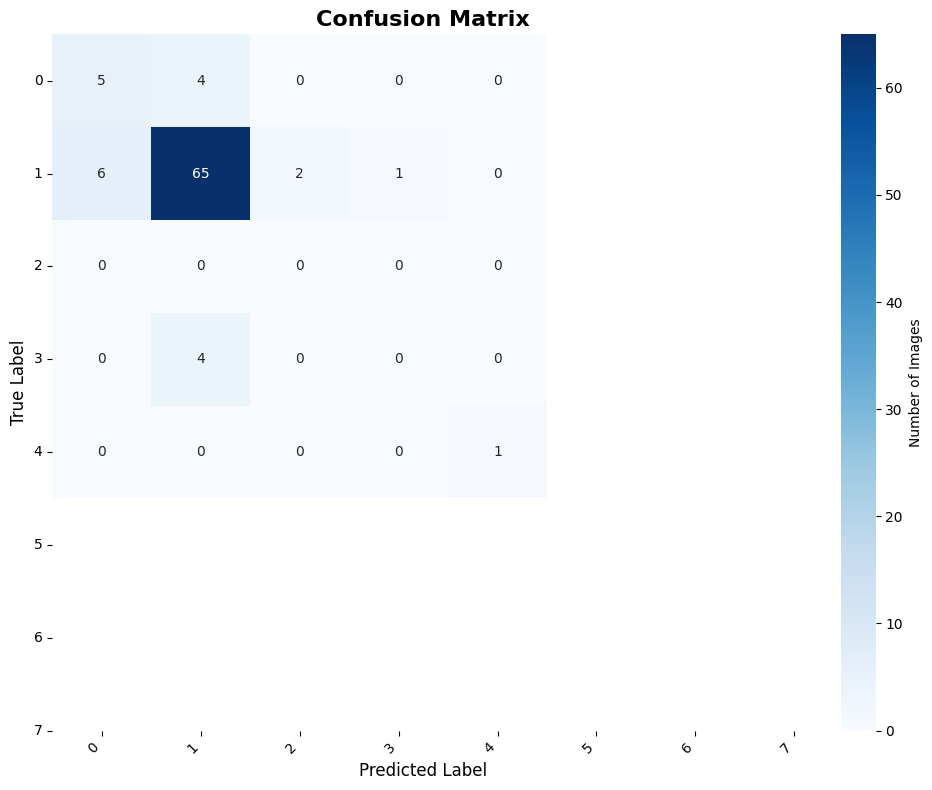

In [30]:
# eda.visualize_errors(data, targets, predictions, probabilities, LABELS)

Модель в итоге предсказывает первые 3 label-а, что произошло из-за неравномерность данных. Хотя при 20 эпохах модель понемногу выравнивается и меньшие классы начинают проявляться лучше. 

И это основная проблема, что я здесь вижу по графикам. Например, ничего вроде того, что в первом центре модель предсказывает болезни по другому, я не вижу, она делает это также с предпочтением к первым трем лейбам, наверное потому что задача в рамках одного центра также сложна, как в рамках всего датасета.

Есть более общая проблема, что модель всегда дает ответ. В тестовой выборке должен быть дополнительный класс, который я что-то не вижу (но на странице про датасет было сказано), который не встречался в обучающией выборке, и на которых модель должна говорить "другое". Может быть после обучения добавить фильтр по порогу на последний слой.

In [15]:
import importlib

importlib.reload(eda)


<module 'eda_helpers' from '/home/kpetrenko/work/third_attempt/EDA/eda_helpers.py'>

Выводы:
Данные неравномерны по болезням, что нужно предсказывать, что видно при обучении модели, поскольку она предпочитает первые три класса.

Изображения разного размера, причем в первом центре у них темные края. При ресайзе остальных изображений стоит замещать их сначала чем-то близко к темному, чтобы они не отличались от первого датацентра, чтобы модель не принимала решение основываясь на темные края. Хотя при обучении тестовой модели не видно, чтобы тепловая матрица отличалась как-то значимо между датацентрами (с учетом что в них могут быть отсутствия классов).

Коррекцию цвета делать не стоит - это является признаком, по которому можно определять модель. Например некоторые классы имеют больше синего цвета относительно красного, чем другие. Красный цвет превалирует, что логично, поскольку это кожа. Однако можно сделать аугментацию по освещению, если такая есть из коробки.

Чисто по форме отличать классы не получится, особенно что родинки могут быть на разных стадиях развития. Можно сделать аугметацию поворотов.